# Ayudantía 12: Análisis Multivariado

Para abrirlo en colab: <a target="_blank" href="https://githubtocolab.com/SysBioengLab/IIQ3402-Statistical-Design/blob/main/Ayudantias/Ayudantia12_AnalisisMultivariado.ipynb">
  <img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/>
</a>

## Motivación

Hasta ahora hemos trabajado mayoritariamente con una o dos variables a la vez. Sin embargo, en problemas reales de ingeniería rara vez medimos un solo parámetro: un proceso químico, un sensor o un experimento entregan **decenas o cientos de variables simultáneamente**. El **análisis multivariado** reúne las herramientas que nos permiten describir, visualizar y encontrar estructura en ese tipo de datos de alta dimensión.

En esta ayudantía recorreremos tres grandes familias de técnicas:

1. **Reducción de dimensionalidad lineal** — PCA (Análisis de Componentes Principales).
2. **Reducción de dimensionalidad no lineal** — t-SNE y UMAP.
3. **Agrupamiento (*clustering*)** — K-Means y agrupamiento jerárquico.

Trabajaremos con dos conjuntos de datos clásicos de `scikit-learn` que nos servirán de hilo conductor:

- **`wine`** — 178 muestras de vino descritas por 13 variables fisicoquímicas (alcohol, flavonoides, prolina, etc.), agrupadas en 3 cultivares. Es un dataset de dimensión *moderada* y con clases relativamente separables.
- **`digits`** — 1797 imágenes de dígitos manuscritos de 8×8 píxeles. Cada imagen se "aplana" en un vector de **64 variables**, y existen 10 clases (los dígitos del 0 al 9). Es un dataset de *alta* dimensión y estructura no lineal.

El contraste entre ambos nos permitirá ver cuándo basta con un método lineal y cuándo necesitamos algo más sofisticado.

In [60]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.datasets import load_wine, load_digits

# Descarga y descripción de los datos

Cargamos ambos conjuntos como `DataFrame` de pandas (`as_frame=True`) para manipularlos cómodamente. Conviene separar siempre:

- `data_*` → la **matriz de características** (lo que usaremos como entrada de los algoritmos).
- `target_*` → las **etiquetas reales** de cada muestra. Ojo: las técnicas de esta ayudantía son *no supervisadas*, es decir, **no usan** las etiquetas para construir el modelo. Las reservamos únicamente para **evaluar a posteriori** qué tan bien los métodos recuperan la estructura conocida.

In [61]:
wine = load_wine(as_frame=True)
data_wine = wine.data
target_wine = wine.target
name_wine = wine.target_names # 0 -> class_0, 1 -> class_1, 2 -> class_2
digits = load_digits(as_frame=True)
data_digits = digits.data
target_digits = digits.target
name_digits = digits.target_names # Cada uno corresponde al número manuscrito

display(data_wine.head())
display(data_digits.head())

,alcohol,malic_acid,ash,alcalinity_of_ash,magnesium,total_phenols,flavanoids,nonflavanoid_phenols,proanthocyanins,color_intensity,hue,od280/od315_of_diluted_wines,proline
0,14.23,1.71,2.43,15.6,127.0,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065.0
1,13.20,1.78,2.14,11.2,100.0,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050.0
2,13.16,2.36,2.67,18.6,101.0,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185.0
3,14.37,1.95,2.50,16.8,113.0,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480.0
4,13.24,2.59,2.87,21.0,118.0,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735.0


,pixel_0_0,pixel_0_1,pixel_0_2,pixel_0_3,pixel_0_4,pixel_0_5,pixel_0_6,pixel_0_7,pixel_1_0,pixel_1_1,...,pixel_6_6,pixel_6_7,pixel_7_0,pixel_7_1,pixel_7_2,pixel_7_3,pixel_7_4,pixel_7_5,pixel_7_6,pixel_7_7
0,0.0,0.0,5.0,13.0,9.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,6.0,13.0,10.0,0.0,0.0,0.0
1,0.0,0.0,0.0,12.0,13.0,5.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,11.0,16.0,10.0,0.0,0.0
2,0.0,0.0,0.0,4.0,15.0,12.0,0.0,0.0,0.0,0.0,...,5.0,0.0,0.0,0.0,0.0,3.0,11.0,16.0,9.0,0.0
3,0.0,0.0,7.0,15.0,13.0,1.0,0.0,0.0,0.0,8.0,...,9.0,0.0,0.0,0.0,7.0,13.0,13.0,9.0,0.0,0.0
4,0.0,0.0,0.0,1.0,11.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,2.0,16.0,4.0,0.0,0.0


Antes de analizar `digits`, conviene **visualizar** algunas muestras para entender qué representan esas 64 variables. Como cada fila es una imagen de 8×8, basta con re-ordenarla (`reshape(8, 8)`) para recuperar el dígito original. Visualicemos algunos ejemplos para entender mejor qué está pasando.

Text(0.5, 1.0, 'Número manuscrito: 3')

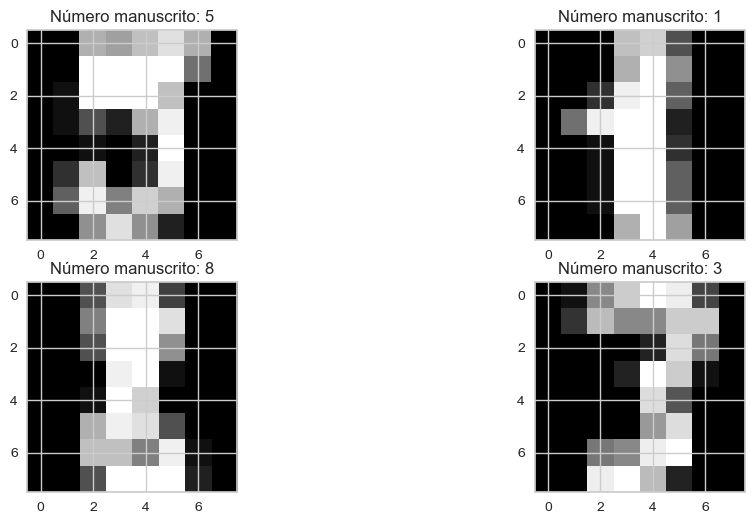

In [62]:
fig, ax = plt.subplots(2, 2, figsize=(12, 6))
ax[0,0].imshow(data_digits.loc[421].values.reshape(8, 8), cmap='gray')
ax[0,0].set_title(f'Número manuscrito: {name_digits[target_digits.loc[421]]}')

ax[0,1].imshow(data_digits.loc[1].values.reshape(8, 8), cmap='gray')
ax[0,1].set_title(f'Número manuscrito: {name_digits[target_digits.loc[1]]}')
ax[1,0].imshow(data_digits.loc[123].values.reshape(8, 8), cmap='gray')
ax[1,0].set_title(f'Número manuscrito: {name_digits[target_digits.loc[123]]}')
ax[1,1].imshow(data_digits.loc[23].values.reshape(8, 8), cmap='gray')  
ax[1,1].set_title(f'Número manuscrito: {name_digits[target_digits.loc[23]]}')

# Análisis de Componentes Principales (PCA)

El **PCA** es la técnica de reducción de dimensionalidad lineal más utilizada. La idea central es construir **nuevas variables** —los *componentes principales*— que son **combinaciones lineales** de las variables originales y que cumplen dos propiedades:

1. Cada componente apunta en la dirección de **máxima varianza** restante de los datos.
2. Los componentes son **ortogonales** (no correlacionados) entre sí.

Así, el primer componente (PC1) captura la mayor parte de la variabilidad, el segundo (PC2) la mayor parte de lo que queda, y así sucesivamente. En la práctica esto permite **resumir** datos de muchas dimensiones en unos pocos componentes que conservan la mayor parte de la información, facilitando la visualización y el análisis posterior.

Antes de aplicar PCA es buena práctica **explorar** las relaciones entre variables. Para eso usaremos gráficos pareados y correlogramas.

## Gráficos Pareados

## Gráficos pareados (*pairplots*)

> Realice un gráfico pareado para evaluar las relaciones entre los parámetros. ¿Es posible encontrar alguna relación entre las variables del conjunto de datos? Utilice la función `sns.pairplot` para facilitar el análisis.

El gráfico pareado, o *pairplot*, organiza en una grilla todos los diagramas de dispersión entre pares de variables. En la **diagonal** se muestra la distribución de cada variable (aquí, una estimación de densidad por clase con `diag_kind='kde'`), y **fuera de la diagonal** la relación entre cada par.

¿Qué buscar al leerlo? Principalmente tres cosas: (i) **tendencias** entre pares de variables —nubes alargadas indican correlación—, (ii) **variables que separan las clases** —cuando los colores se ven en regiones distintas— y (iii) **redundancia** entre variables que aportan información similar. Coloreamos por `target` (`hue`) solo para inspeccionar visualmente; el algoritmo de PCA no usa esa información.

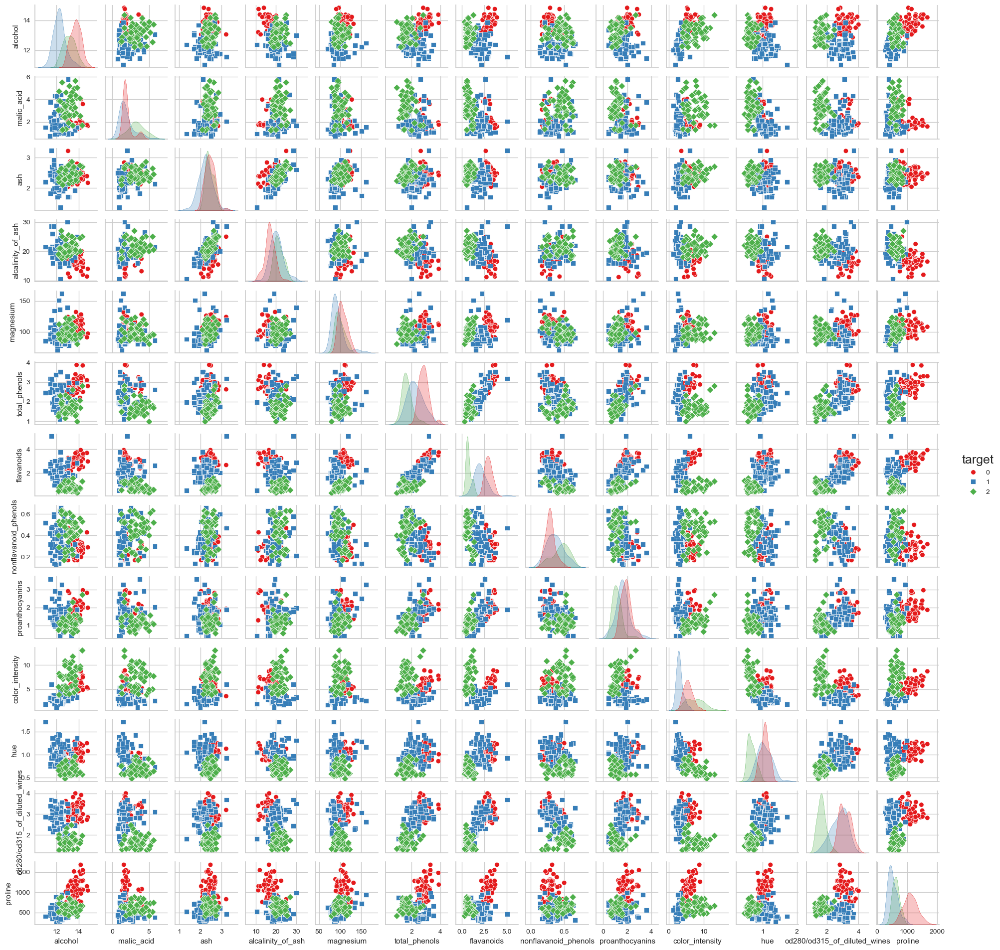

In [63]:
## Pair plot wine
dat_pair = data_wine.copy()
dat_pair['target'] = target_wine
sns.pairplot(dat_pair, hue='target', palette='Set1', markers=["o", "s", "D"], diag_kind='kde',
             height=1.5)

Note que el *pairplot* genera una grilla de tamaño *p × p*: con 13 variables ya son 169 subgráficos, y con las 64 de `digits` serían más de 4000. Esto ilustra un punto clave: **inspeccionar visualmente par a par no escala** a datos de alta dimensión. Por esa razón omitiremos el *pairplot* de `digits` y necesitaremos herramientas que **resuman** la información, como PCA.

# Correlogramas

> Analice la correlación entre las variables mediante un correlograma. ¿Qué conclusiones puede extraer?

El correlograma es un **mapa de calor de la matriz de correlación**: una forma compacta de visualizar cómo se relacionan todas las variables entre sí. Cada celda muestra el coeficiente de correlación entre dos variables, donde valores cercanos a **+1** (rojo) indican una relación lineal positiva fuerte, cercanos a **−1** (azul) una negativa fuerte, y cercanos a **0** ausencia de relación lineal.

Compararemos dos coeficientes:

- **Pearson** mide correlación **lineal** y es sensible a valores atípicos.
- **Spearman** mide correlación **monótona** (por rangos) y es más robusto frente a relaciones no lineales y *outliers*.

Cuando ambos difieren mucho para un par de variables, suele ser señal de una relación no lineal o de la presencia de datos atípicos. La existencia de bloques de variables muy correlacionadas, además, anticipa que **pocos componentes principales** podrán capturar gran parte de la varianza.

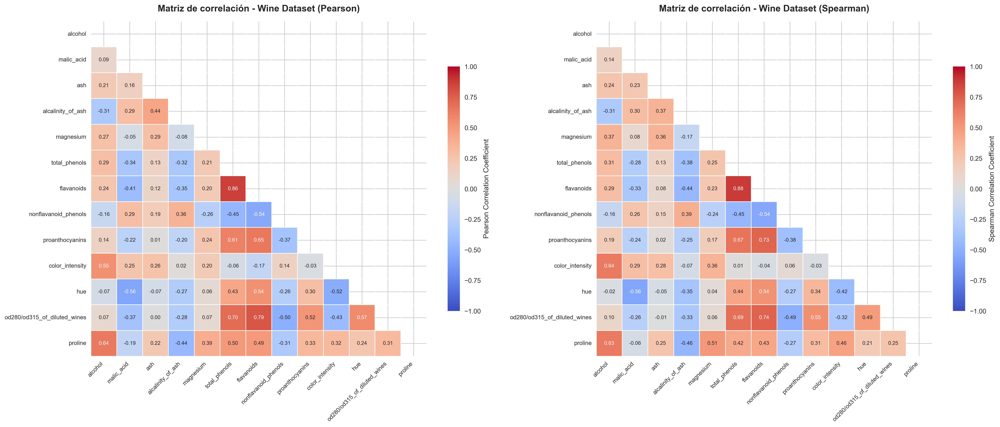

In [95]:

fig, ax = plt.subplots(1, 2, figsize=(22, 9), dpi=300)


mask = np.triu(np.ones_like(data_wine.corr(), dtype=bool))


annot_options = {"size": 8, "weight": "normal"}

# --- Subplot 1: Pearson ---
corr_pearson = data_wine.corr()
sns.heatmap(
    corr_pearson,
    mask=mask,  # Apply mask
    annot=True,
    fmt=".2f",
    cmap="coolwarm",
    ax=ax[0],
    vmin=-1,
    vmax=1,
    center=0,
    square=True,
    linewidths=0.5,
    cbar_kws={"label": "Pearson Correlation Coefficient", "shrink": 0.7},
    annot_kws=annot_options,  # Apply smaller font size
)

ax[0].set_title(
    "Matriz de correlación - Wine Dataset (Pearson)",
    fontsize=14,
    pad=15,
    weight="bold",
)
ax[0].set_xticklabels(
    ax[0].get_xticklabels(), rotation=45, horizontalalignment="right", fontsize=9
)
ax[0].set_yticklabels(ax[0].get_yticklabels(), rotation=0, fontsize=9)


# --- Subplot 2: Spearman ---
corr_spearman = data_wine.corr(method="spearman")
sns.heatmap(
    corr_spearman,
    mask=mask,  # Apply mask
    annot=True,
    fmt=".2f",
    cmap="coolwarm",
    ax=ax[1],
    vmin=-1,
    vmax=1,
    center=0,
    square=True,
    linewidths=0.5,
    cbar_kws={"label": "Spearman Correlation Coefficient", "shrink": 0.7},
    annot_kws=annot_options,  # Apply smaller font size
)

ax[1].set_title(
    "Matriz de correlación - Wine Dataset (Spearman)",
    fontsize=14,
    pad=15,
    weight="bold",
)
ax[1].set_xticklabels(
    ax[1].get_xticklabels(), rotation=45, horizontalalignment="right", fontsize=9
)
ax[1].set_yticklabels(ax[1].get_yticklabels(), rotation=0, fontsize=9)

# Adjust layout to prevent clipping of labels
plt.tight_layout()
plt.show()

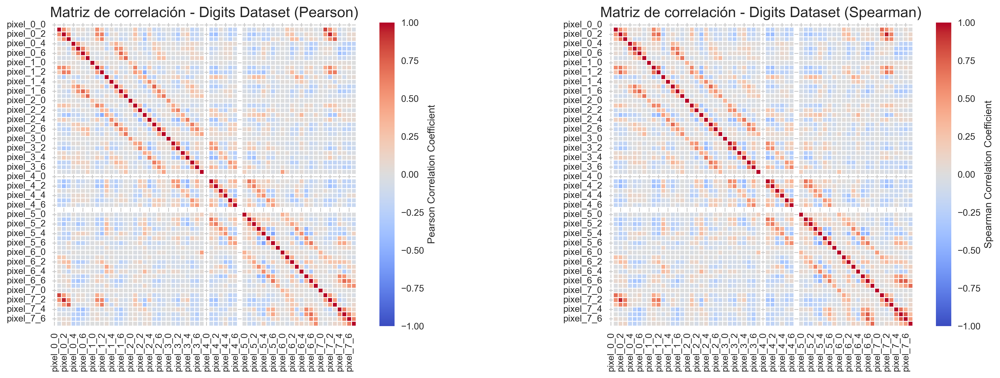

In [65]:
# Wine
fig, ax = plt.subplots(1,2,figsize=(20, 6), dpi = 300)
corr_digits = data_digits.corr()

sns.heatmap(corr_digits, annot=False, fmt=".2f", cmap='coolwarm', ax=ax[0],
            vmin=-1, vmax=1, center=0, square=True, linewidths=.5,
            cbar_kws={'label': 'Pearson Correlation Coefficient'})
ax[0].set_title('Matriz de correlación - Digits Dataset (Pearson)', fontsize=16)


corr_digits = data_digits.corr(method='spearman')
sns.heatmap(corr_digits, annot=False, fmt=".2f", cmap='coolwarm', ax=ax[1],
            vmin=-1, vmax=1, center=0, square=True, linewidths=.5,
            cbar_kws={'label': 'Spearman Correlation Coefficient'})

ax[1].set_title('Matriz de correlación - Digits Dataset (Spearman)', fontsize=16)
plt.show()

## Generación del PCA

>Realice una reducción de dimensionalidad utilizando PCA. Estime cuánta varianza captura
cada componente y determine cuántos componentes conservaría para análisis posteriores.

Generar los *embeddings* con PCA es sencillo en `python`, ya que es una técnica clásica y ampliamente utilizada. Usaremos el paquete `pca` —porque facilita los gráficos— pero también está disponible `sklearn.decomposition.PCA`, que es la forma estándar.

La pregunta clave es **cuántos componentes conservar**. Para responderla examinamos la **varianza explicada** por cada componente mediante un *scree plot* (gráfico de sedimentación): se grafica la fracción de varianza que aporta cada componente y se busca un punto de "codo" donde la curva se aplana, o bien la cantidad de componentes necesaria para acumular un umbral de varianza (típicamente **90–95%**).

Text(0.5, 1.0, 'Varianza explicada por cada componente principal - Wine Dataset')

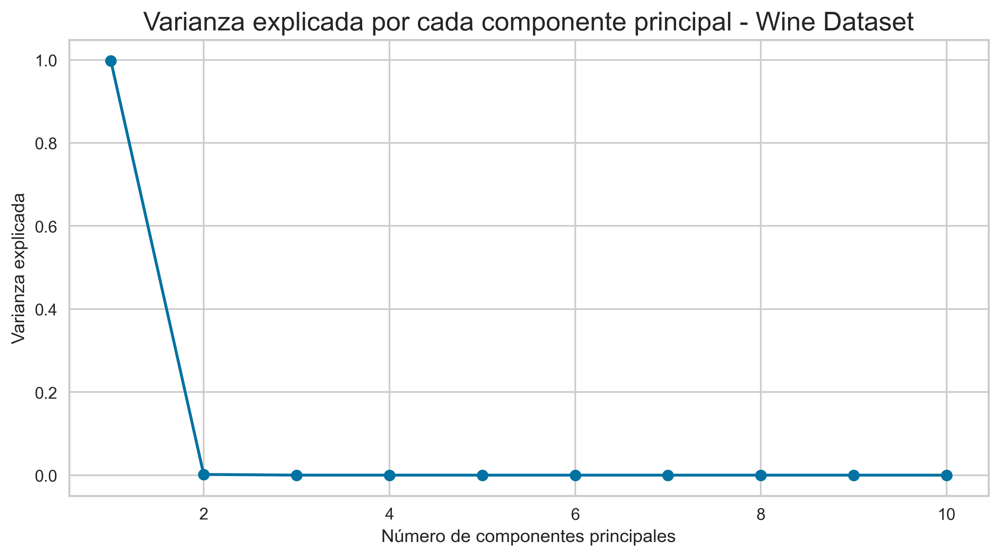

In [66]:
from pca import pca
from sklearn.decomposition import PCA
# partimos con pca de sklearn para investigar
skPCA_wine = PCA(n_components=10)
skPCA_wine.fit(data_wine)
explained_variance_wine = skPCA_wine.explained_variance_ratio_
fig, ax = plt.subplots(figsize=(10, 5), dpi = 300)
ax.plot(range(1, len(explained_variance_wine) + 1), explained_variance_wine, marker='o')
ax.set_xlabel('Número de componentes principales')
ax.set_ylabel('Varianza explicada')
ax.set_title('Varianza explicada por cada componente principal - Wine Dataset', fontsize=16)

¿Qué pasó aquí?

Observe que **un único componente** parece capturar casi toda la varianza. Esto debería llamarnos la atención: difícilmente una sola dirección resume 13 variables fisicoquímicas distintas.

Este es un comportamiento típico cuando las variables tienen **escalas (magnitudes) muy distintas**. PCA maximiza varianza, y la varianza depende de las unidades: una variable medida en cientos dominará a otra medida en decimales, aunque no sea más "informativa". Veámoslo con un *boxplot* de las variables originales:

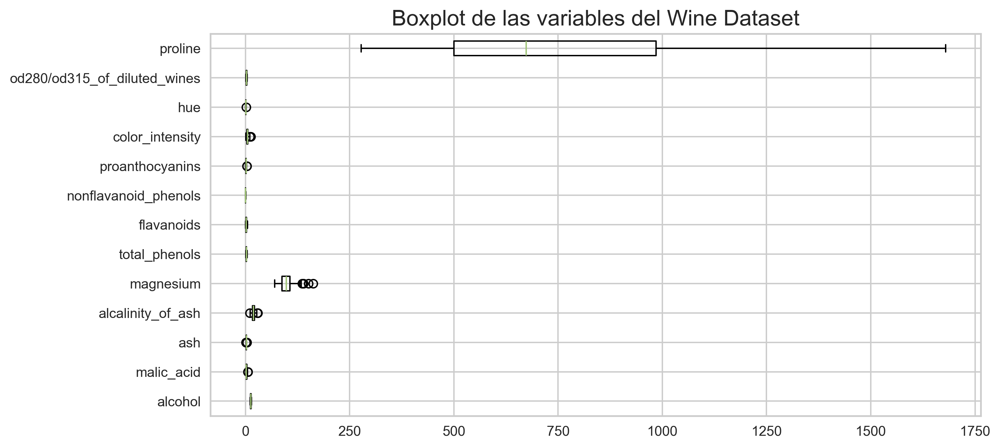

In [67]:
fig, ax = plt.subplots(figsize=(10, 5), dpi = 300)
ax.boxplot(data_wine, vert=False)
ax.set_yticklabels(data_wine.columns)
ax.set_title('Boxplot de las variables del Wine Dataset', fontsize=16)
plt.show()
# Ahora con nuestro PCA

Podemos ver entonces cómo la variable `proline` es la que posee la mayor varianza y magnitud; en consecuencia, los componentes principales explican mayoritariamente la varianza de **esa** variable, ignorando a las demás. Para evitar este sesgo se aplica una **estandarización**: a cada variable se le resta su media y se divide por su desviación estándar, de modo que todas queden con media 0 y varianza 1 (`StandardScaler`). Así, todas las variables contribuyen en **igualdad de condiciones** al análisis.

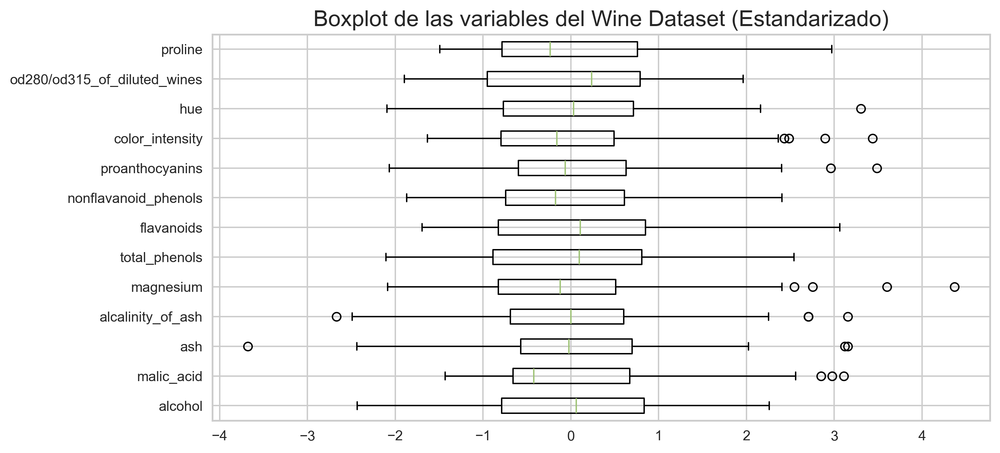

In [68]:
from sklearn.preprocessing import StandardScaler
wine_scaler = StandardScaler()
wine_standard = pd.DataFrame(wine_scaler.fit_transform(data_wine), columns=data_wine.columns)
fig, ax = plt.subplots(figsize=(10, 5), dpi = 300)
ax.boxplot(wine_standard, vert=False)
ax.set_yticklabels(wine_standard.columns)
ax.set_title('Boxplot de las variables del Wine Dataset (Estandarizado)', fontsize=16)
plt.show()

Ahora la varianza se distribuye de forma "equitativa" entre las variables (todas con desviación estándar ≈ 1). Repitamos el procedimiento de PCA sobre los datos **estandarizados** y comparemos el *scree plot*.

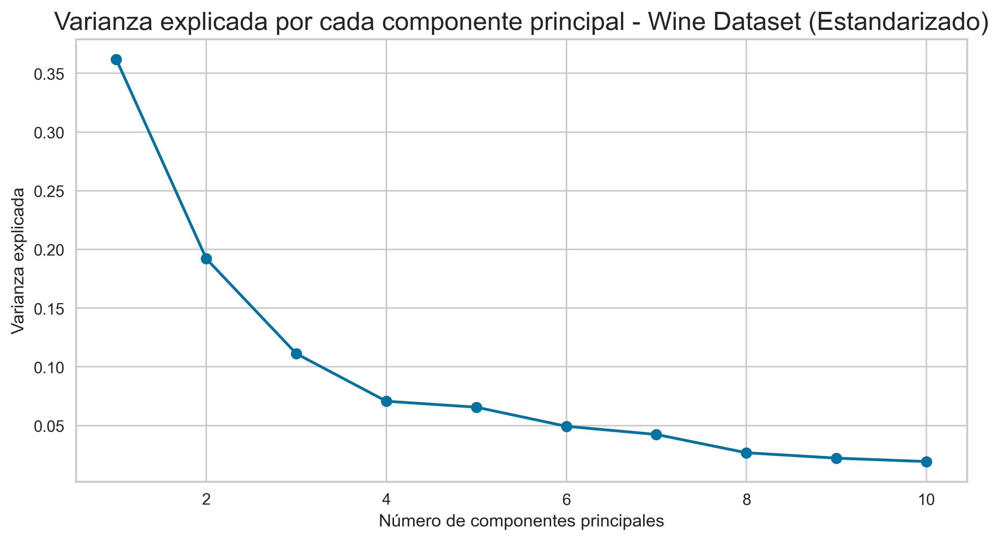

In [69]:
skPCA_wine_standar = PCA(n_components=10)
skPCA_wine_standar.fit(wine_standard)
explained_variance_wine_standar = skPCA_wine_standar.explained_variance_ratio_
fig, ax = plt.subplots(figsize=(10, 5), dpi = 300)
ax.plot(range(1, len(explained_variance_wine_standar) + 1), explained_variance_wine_standar, marker='o')
ax.set_xlabel('Número de componentes principales')
ax.set_ylabel('Varianza explicada')
ax.set_title('Varianza explicada por cada componente principal - Wine Dataset (Estandarizado)', fontsize=16)
plt.show()

Ahora los componentes principales capturan el comportamiento de **todas** las variables de forma fidedigna, y se necesita más de un componente para explicar la varianza. Esto ilustra una **regla práctica fundamental**: salvo que las variables ya estén en unidades comparables, **siempre se debe estandarizar antes de aplicar PCA**.

> **Para llevar:** observe en el gráfico cuántos componentes se requieren para superar el 90–95% de varianza acumulada — ese es el número que conservaríamos para análisis posteriores.

[10-06-2026 14:45:12] [pca.pca] [INFO] Extracting column labels from dataframe.
[10-06-2026 14:45:12] [pca.pca] [INFO] Normalizing input data per feature (zero mean and unit variance)..
[10-06-2026 14:45:12] [pca.pca] [INFO] The PCA reduction is performed on 13 variables (columns) of the input dataframe.
[10-06-2026 14:45:12] [pca.pca] [INFO] Fit using PCA.
[10-06-2026 14:45:12] [pca.pca] [INFO] Compute loadings and PCs.
[10-06-2026 14:45:12] [pca.pca] [INFO] Compute explained variance.
[10-06-2026 14:45:12] [pca.pca] [INFO] Outlier detection using Hotelling T2 test with alpha=[0.05] and n_components=[13]
[10-06-2026 14:45:12] [pca.pca] [INFO] Multiple test correction applied for Hotelling T2 test: [fdr_bh]
[10-06-2026 14:45:12] [pca.pca] [INFO] Outlier detection using SPE/DmodX with n_std=[3]


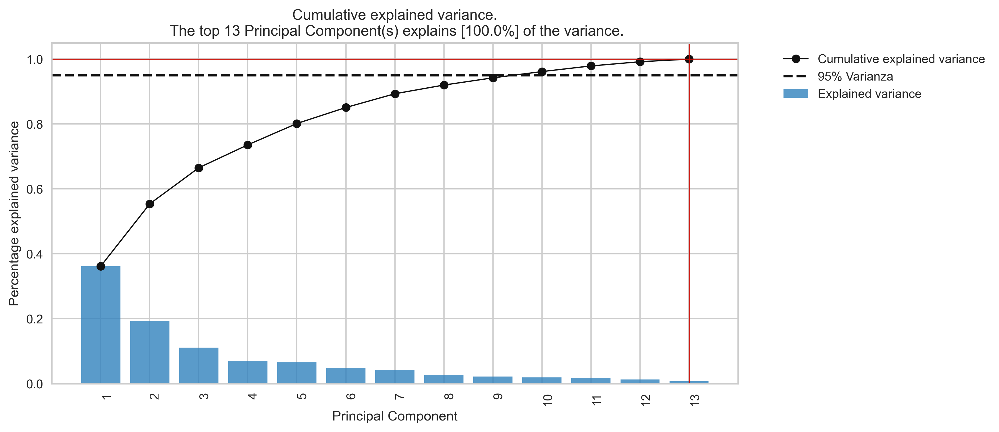

In [70]:
pca_wine = pca(n_components=data_wine.shape[1],
               normalize=True) # por defecto al libreria pca permite normalizar los datos
pca_data_wine = pca_wine.fit_transform(data_wine, target_wine)
fig, ax = plt.subplots(figsize=(10, 5), dpi = 300)
pca_wine.plot(ax = ax)
ax.axhline(y=0.95, color='k', linestyle='--', linewidth=2, label = '95% Varianza')
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')


[10-06-2026 14:45:12] [pca.pca] [INFO] Extracting column labels from dataframe.
[10-06-2026 14:45:12] [pca.pca] [INFO] Extracting row labels from dataframe.
[10-06-2026 14:45:12] [pca.pca] [INFO] The PCA reduction is performed on 64 variables (columns) of the input dataframe.
[10-06-2026 14:45:12] [pca.pca] [INFO] Fit using PCA.
[10-06-2026 14:45:12] [pca.pca] [INFO] Compute loadings and PCs.
[10-06-2026 14:45:12] [pca.pca] [INFO] Compute explained variance.
[10-06-2026 14:45:12] [pca.pca] [INFO] Outlier detection using Hotelling T2 test with alpha=[0.05] and n_components=[50]
[10-06-2026 14:45:12] [pca.pca] [INFO] Multiple test correction applied for Hotelling T2 test: [fdr_bh]
[10-06-2026 14:45:12] [pca.pca] [INFO] Outlier detection using SPE/DmodX with n_std=[3]


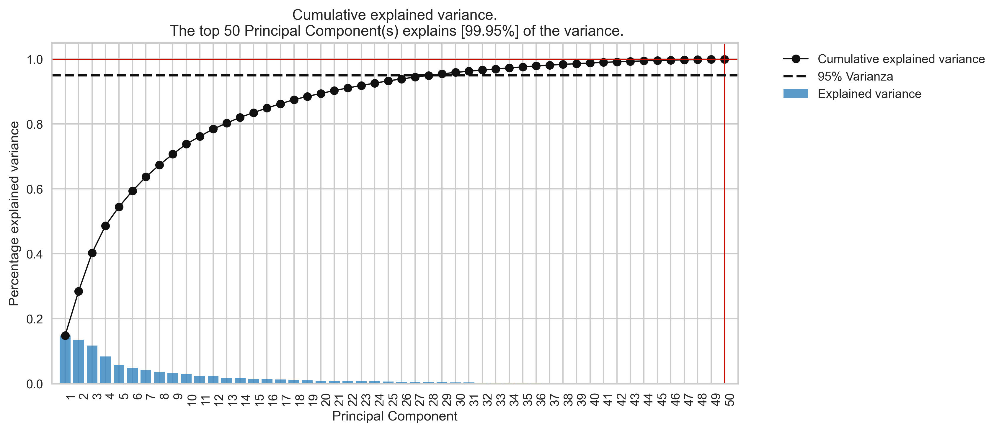

In [71]:
pca_digists = pca(n_components=50,
               normalize=False) # por defecto al libreria pca permite normalizar los datos
pca_data_digits = pca_digists.fit_transform(data_digits)
fig, ax = plt.subplots(figsize=(10, 5), dpi = 300)
pca_digists.plot(ax = ax)
ax.axhline(y=0.95, color='k', linestyle='--', linewidth=2, label = '95% Varianza')
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')# 

[10-06-2026 14:45:13] [pca.pca] [INFO] Extracting column labels from dataframe.
[10-06-2026 14:45:13] [pca.pca] [INFO] Extracting row labels from dataframe.
[10-06-2026 14:45:13] [pca.pca] [INFO] Normalizing input data per feature (zero mean and unit variance)..
[10-06-2026 14:45:13] [pca.pca] [INFO] The PCA reduction is performed on 64 variables (columns) of the input dataframe.
[10-06-2026 14:45:13] [pca.pca] [INFO] Fit using PCA.
[10-06-2026 14:45:13] [pca.pca] [INFO] Compute loadings and PCs.
[10-06-2026 14:45:13] [pca.pca] [INFO] Compute explained variance.
[10-06-2026 14:45:13] [pca.pca] [INFO] Outlier detection using Hotelling T2 test with alpha=[0.05] and n_components=[50]
[10-06-2026 14:45:13] [pca.pca] [INFO] Multiple test correction applied for Hotelling T2 test: [fdr_bh]
[10-06-2026 14:45:13] [pca.pca] [INFO] Outlier detection using SPE/DmodX with n_std=[3]


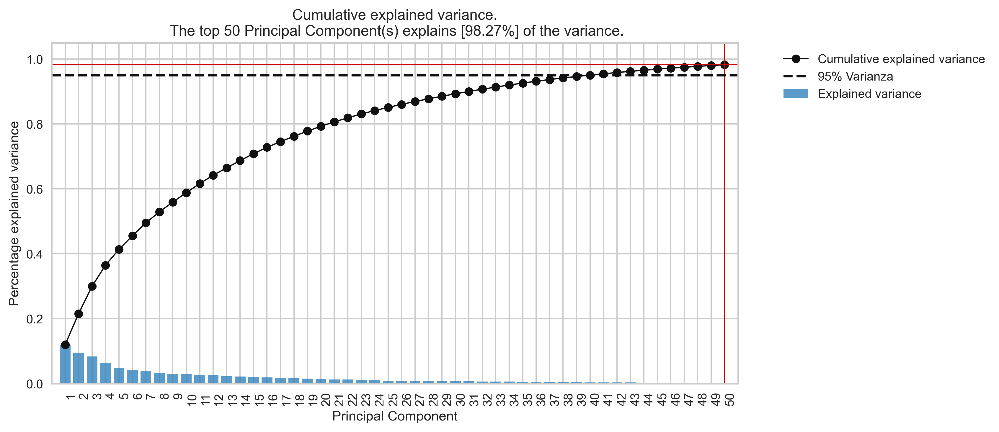

In [72]:
pca_digists = pca(n_components=50,
               normalize=True) # por defecto al libreria pca permite normalizar los datos
pca_data_digits = pca_digists.fit_transform(data_digits)
fig, ax = plt.subplots(figsize=(10, 5), dpi = 300)
pca_digists.plot(ax = ax)
ax.axhline(y=0.95, color='k', linestyle='--', linewidth=2, label = '95% Varianza')
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')# 

# Biplot

> Grafique los componentes principales e interprete los resultados. A la vez, visualice los *loadings* utilizando un biplot.

Un **biplot** superpone dos tipos de información en el mismo plano (PC1 vs PC2):

- Los **puntos** (*scores*) son las muestras proyectadas sobre los dos primeros componentes. Su agrupamiento revela estructura: muestras cercanas son similares.
- Las **flechas** (*loadings*) representan las variables originales. La **dirección** de cada flecha indica hacia qué componente contribuye la variable, su **longitud** cuánto pesa, y el **ángulo entre flechas** aproxima la correlación entre variables (ángulos pequeños → correlación positiva; opuestos → negativa; perpendiculares → no correlacionadas).

Leer ambos juntos permite responder *qué variables* explican la separación entre grupos.

[10-06-2026 14:45:13] [pca.pca] [INFO] Plot PC1 vs PC2 with loadings.
[10-06-2026 14:45:13] [scatterd.scatterd] [INFO] Create scatterplot


(<Figure size 2500x1500 with 1 Axes>,
 <Axes: title={'center': 'The top 13 Principal Component(s) explains [100.0%] of the variance.'}, xlabel='PC1 (36.1% expl.var)', ylabel='PC2 (19.2% expl.var)'>)

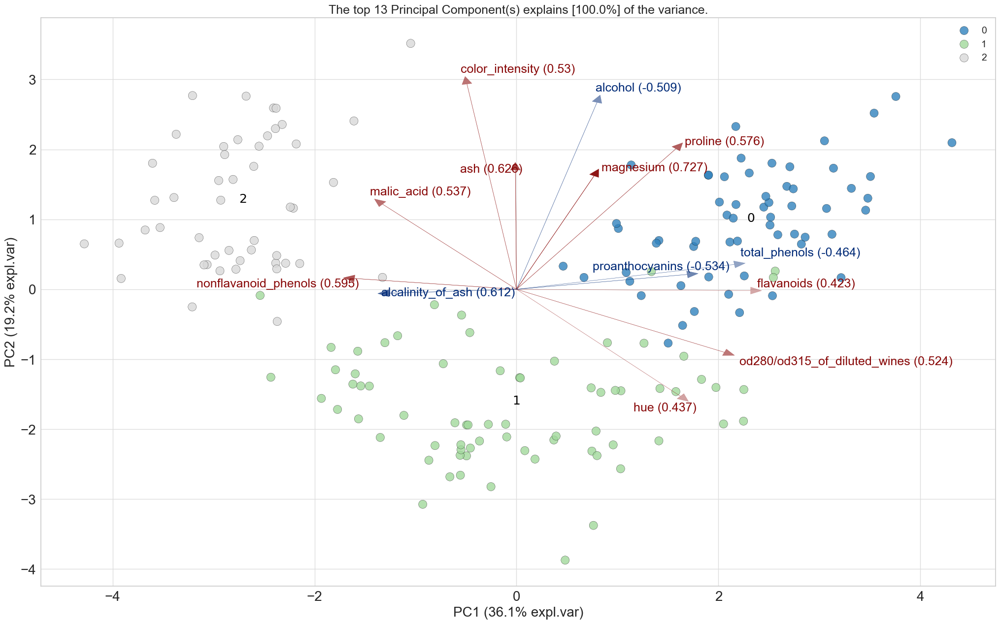

In [73]:
pca_wine.biplot()

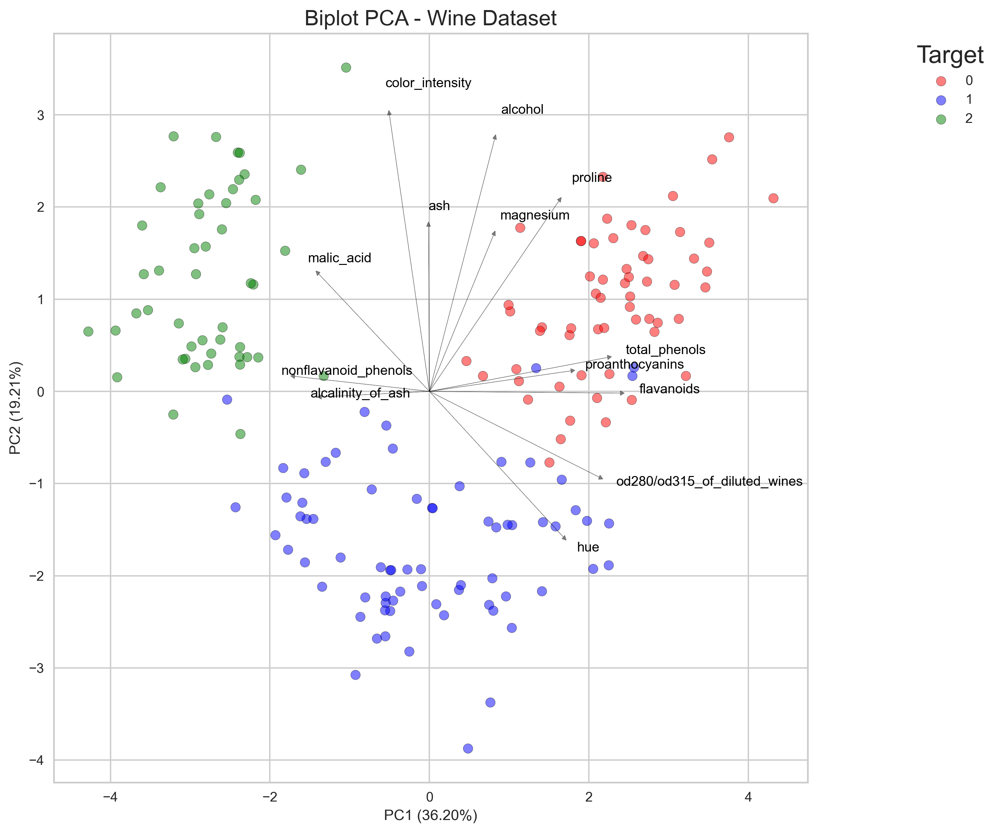

In [74]:
# CODIGO POR SI QUIEREN ENTENDER QUE PASA POR DETRAS Y QUIEREN MODIFICARLO
from sklearn.preprocessing import minmax_scale
fig, ax = plt.subplots(1,figsize=(10, 10), dpi = 300)

pca_data_wine_target = pca_data_wine['PC'].copy()
pca_data_wine_target['target'] = target_wine.values
loadings = pca_data_wine['loadings'].copy()
colors = ['red', 'blue', 'green']
for c, targ in enumerate(pca_data_wine_target['target'].unique()):
    unique_target = pca_data_wine_target[pca_data_wine_target['target'] == targ]
    ax.scatter(unique_target['PC1'], unique_target['PC2'], label=targ, s=50,
               color=colors[c], alpha=0.5, edgecolor='black')
scaling_factor = 3.0 / np.max(np.abs(loadings.loc[['PC1', 'PC2']].values))
loadings.loc[['PC1', 'PC2']] *= scaling_factor
for i, col in enumerate(loadings.columns):
    ax.arrow(0, 0, loadings[col]['PC1'], loadings[col]['PC2'], 
             color='black', alpha=0.5, head_width=0.05, head_length=0.05)
    ax.text(loadings[col]['PC1']*1.1, loadings[col]['PC2']*1.1, col, 
            color='black', fontsize=10)

explaine_var_wine = pca_data_wine['explained_var']
ax.set_xlabel('PC1' + f' ({explaine_var_wine[0]:.2%})')
ax.set_ylabel('PC2' + f' ({explaine_var_wine[1] - explaine_var_wine[0] :.2%})')
ax.set_title('Biplot PCA - Wine Dataset', fontsize=16)
ax.legend(title='Target', loc='upper right', bbox_to_anchor=(1.25, 1))
plt.show()

Para los datos de `digits` no graficaremos los *loadings*: con 64 variables (píxeles) tendríamos 64 flechas superpuestas, ilegibles e imposibles de interpretar. Mostraremos solo los *scores*.

> Repita los procedimientos anteriores con el conjunto de datos digits. ¿Qué observa en los
gráficos resultantes?

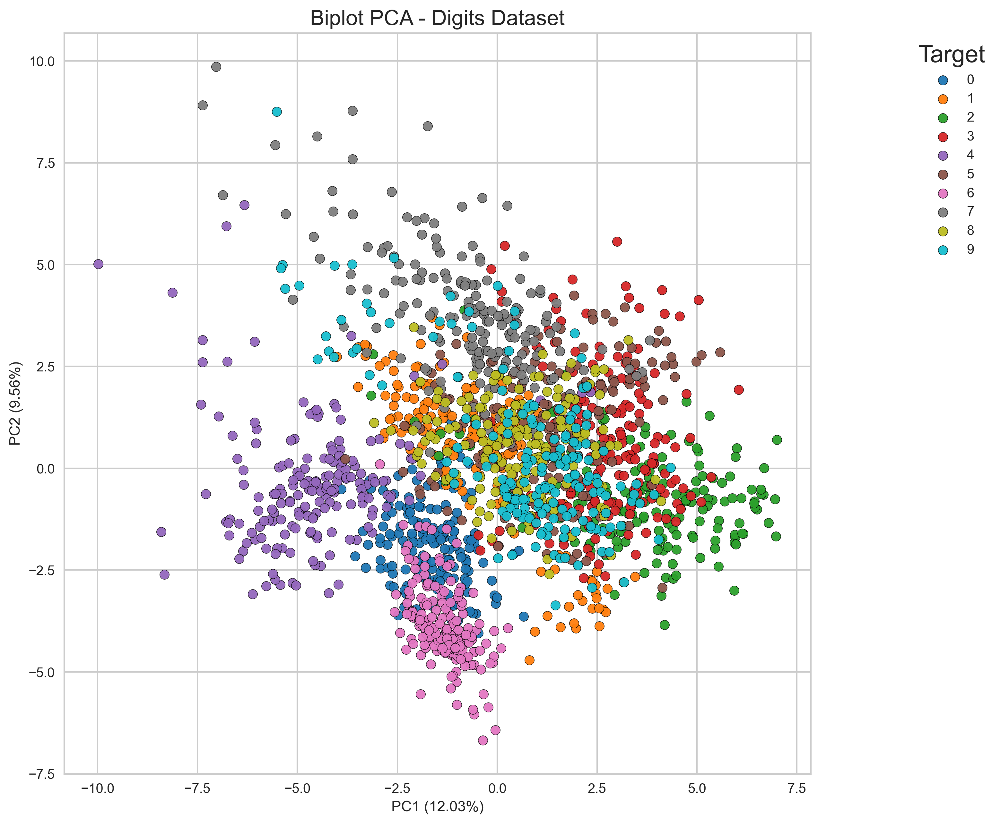

In [75]:
# ahora con digits without the loadings
import matplotlib.style
import matplotlib as mpl


fig, ax = plt.subplots(1,figsize=(10, 10), dpi = 300)
pca_data_digits_target = pca_data_digits['PC'].copy()
pca_data_digits_target['target'] = target_digits.values
colors = sns.color_palette("tab10", len(pca_data_digits_target['target'].unique()))
for c, targ in enumerate(pca_data_digits_target['target'].unique()):
    unique_target = pca_data_digits_target[pca_data_digits_target['target'] == targ]
    ax.scatter(unique_target['PC1'], unique_target['PC2'], label=targ, s=50,
               color=colors[c], alpha=0.95, edgecolor='black')
explaine_var_digits = pca_data_digits['explained_var']
ax.set_xlabel('PC1' + f' ({explaine_var_digits[0]:.2%})')
ax.set_ylabel('PC2' + f' ({explaine_var_digits[1] - explaine_var_digits[0] :.2%})')
ax.set_title('Biplot PCA - Digits Dataset', fontsize=16)
ax.legend(title='Target', loc='upper right', bbox_to_anchor=(1.25, 1))
plt.show()


Es interesante notar la diferencia entre ambas situaciones. El dataset de `wine` presenta grupos **claramente separados** ya en dos componentes lineales, lo que sugiere que su estructura es esencialmente **lineal**. En cambio, en `digits` los grupos se **solapan** y son difíciles de separar con PCA: dos componentes lineales no bastan para describir un conjunto con estructura **no lineal** y de mayor dimensión intrínseca.

Esta limitación es precisamente la que motiva las técnicas de la siguiente sección.

# Reducción de dimensión no lineal

> Investigue las técnicas t-SNE y UMAP y genere el *embedding* de los datos `digits`. ¿Qué precauciones debe tener en cuenta al aplicar estas técnicas?

A diferencia de PCA, que solo puede capturar relaciones **lineales**, t-SNE y UMAP son métodos **no lineales** diseñados para **visualizar** datos de alta dimensión preservando la estructura *local* (qué puntos son vecinos de cuáles). Aquí daremos solo una noción de las técnicas; para profundizar:

- **t-SNE**: https://www.jmlr.org/papers/volume9/vandermaaten08a/vandermaaten08a.pdf
- **UMAP**: https://umap-learn.readthedocs.io/en/latest/basic_usage.html

A grandes rasgos, **t-SNE** toma una perspectiva estadística: minimiza la divergencia entre las distribuciones de distancias de cada punto en el espacio original y en el reducido. **UMAP**, en cambio, se apoya en la **topología** de los datos para preservar tanto la estructura local como, en parte, la global. **A grandes rasgos**.

> **Precauciones al usar t-SNE y UMAP:**
>
> - **Estandarice primero.** Al igual que en PCA, ambas técnicas se basan en distancias y son sensibles a la escala de las variables.
> - **No interprete las distancias globales.** El tamaño de los grupos, las distancias entre ellos y el espacio vacío en el gráfico **no** tienen un significado cuantitativo confiable. Solo la *pertenencia* a un grupo (estructura local) es informativa.
> - **Son sensibles a los hiperparámetros.** La `perplexity` en t-SNE y los `n_neighbors` / `min_dist` en UMAP controlan el balance entre estructura local y global; conviene probar varios valores.
> - **Son estocásticas.** Distintas semillas (`random_state`) producen *embeddings* distintos; fíjela para reproducibilidad.
> - **Son herramientas de visualización, no de inferencia.** Úselas para explorar y generar hipótesis, no para concluir estadísticamente.

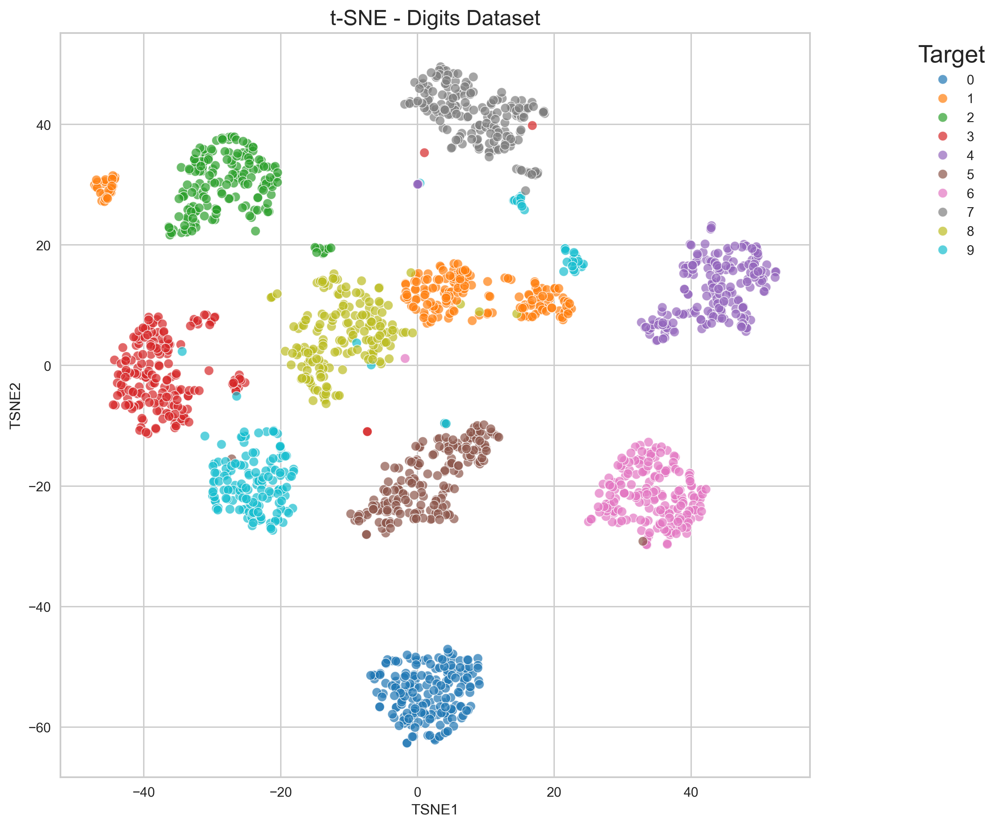

In [76]:
from sklearn.manifold import TSNE

# para digits
tsne_digits = TSNE(n_components=2, random_state=42, perplexity=30)
tsne_data_digits = tsne_digits.fit_transform(data_digits)
tsne_data_digits = pd.DataFrame(tsne_data_digits, columns=['TSNE1', 'TSNE2'])
tsne_data_digits['target'] = target_digits.values
fig, ax = plt.subplots(figsize=(10, 10), dpi = 300)
sns.scatterplot(data=tsne_data_digits, x='TSNE1', y='TSNE2', hue='target', palette='tab10', ax=ax, s=50, alpha=0.7)
ax.set_title('t-SNE - Digits Dataset', fontsize=16)
ax.set_xlabel('TSNE1')
ax.set_ylabel('TSNE2')
plt.legend(title='Target', loc='upper right', bbox_to_anchor=(1.25, 1))
plt.show()

/Users/gabbi/miniconda3/envs/SaaLab/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


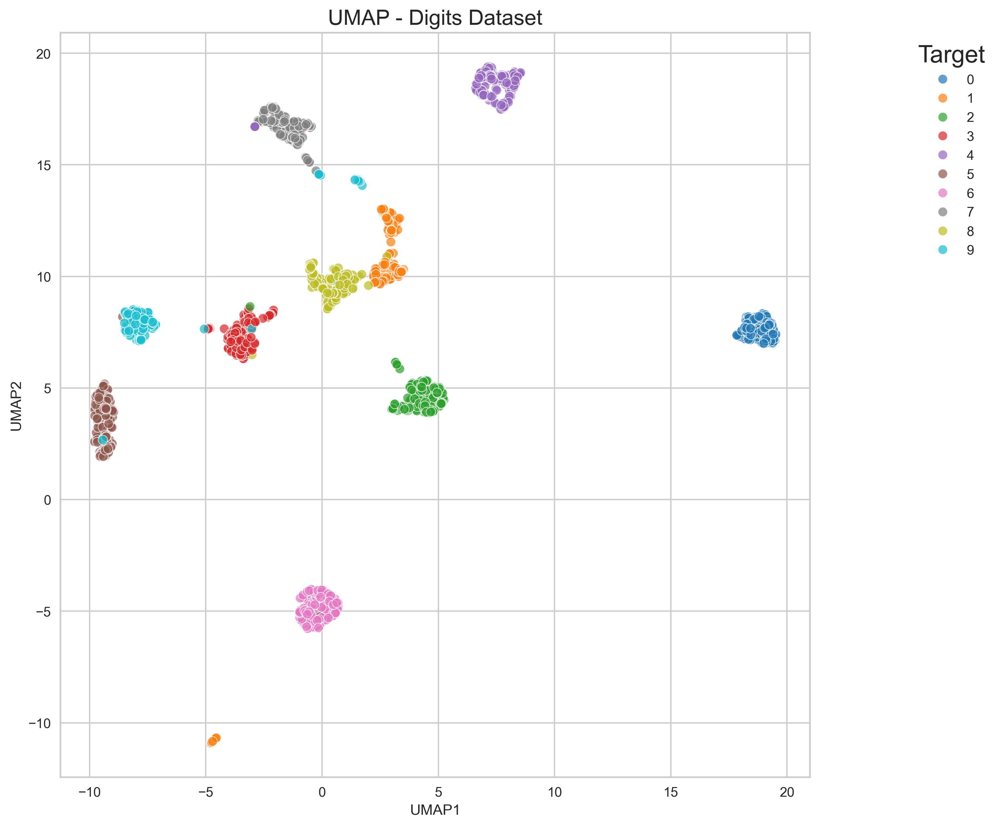

In [77]:
# UMAP digits
import umap
umap_digits = umap.UMAP(n_components=2, random_state=42)
umap_data_digits = umap_digits.fit_transform(data_digits)
umap_data_digits = pd.DataFrame(umap_data_digits, columns=['UMAP1', 'UMAP2'])
umap_data_digits['target'] = target_digits.values
fig, ax = plt.subplots(figsize=(10, 10), dpi = 300)
sns.scatterplot(data=umap_data_digits, x='UMAP1', y='UMAP2', hue='target', palette='tab10', ax=ax, s=50, alpha=0.7)
ax.set_title('UMAP - Digits Dataset', fontsize=16)
ax.set_xlabel('UMAP1')
ax.set_ylabel('UMAP2')
plt.legend(title='Target', loc='upper right', bbox_to_anchor=(1.25, 1))
plt.show()

Estas técnicas no se limitan a `digits`: también funcionan bien con el dataset de `wine` —al menos UMAP—, recuperando con claridad sus tres cultivares.

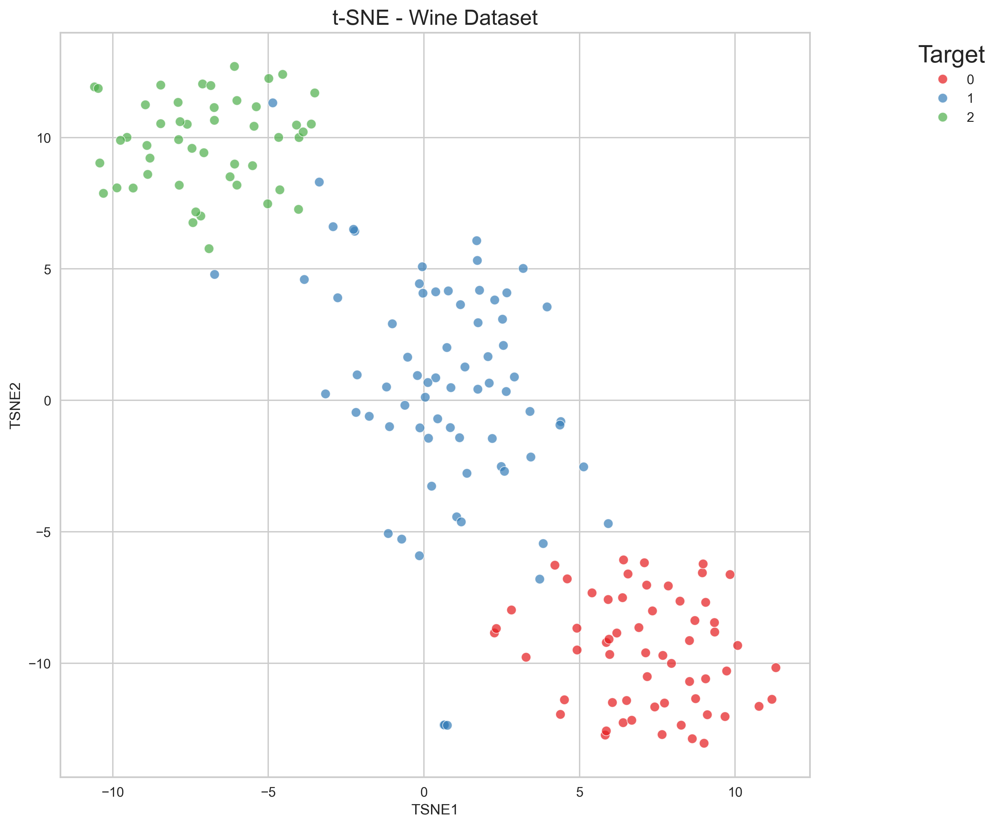

In [78]:
tsne_wine = TSNE(n_components=2, random_state=42, perplexity=30, max_iter=1000)
standard_wine = pd.DataFrame(StandardScaler().fit_transform(data_wine), columns=data_wine.columns)

tsne_data_wine = tsne_wine.fit_transform(standard_wine)
tsne_data_wine = pd.DataFrame(tsne_data_wine, columns=['TSNE1', 'TSNE2'])
tsne_data_wine['target'] = target_wine.values
fig, ax = plt.subplots(figsize=(10, 10), dpi = 300)
sns.scatterplot(data=tsne_data_wine, x='TSNE1', y='TSNE2', hue='target', palette='Set1', ax=ax, s=50, alpha=0.7)
ax.set_title('t-SNE - Wine Dataset', fontsize=16)
ax.set_xlabel('TSNE1')
ax.set_ylabel('TSNE2')
plt.legend(title='Target', loc='upper right', bbox_to_anchor=(1.25, 1))

/Users/gabbi/miniconda3/envs/SaaLab/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


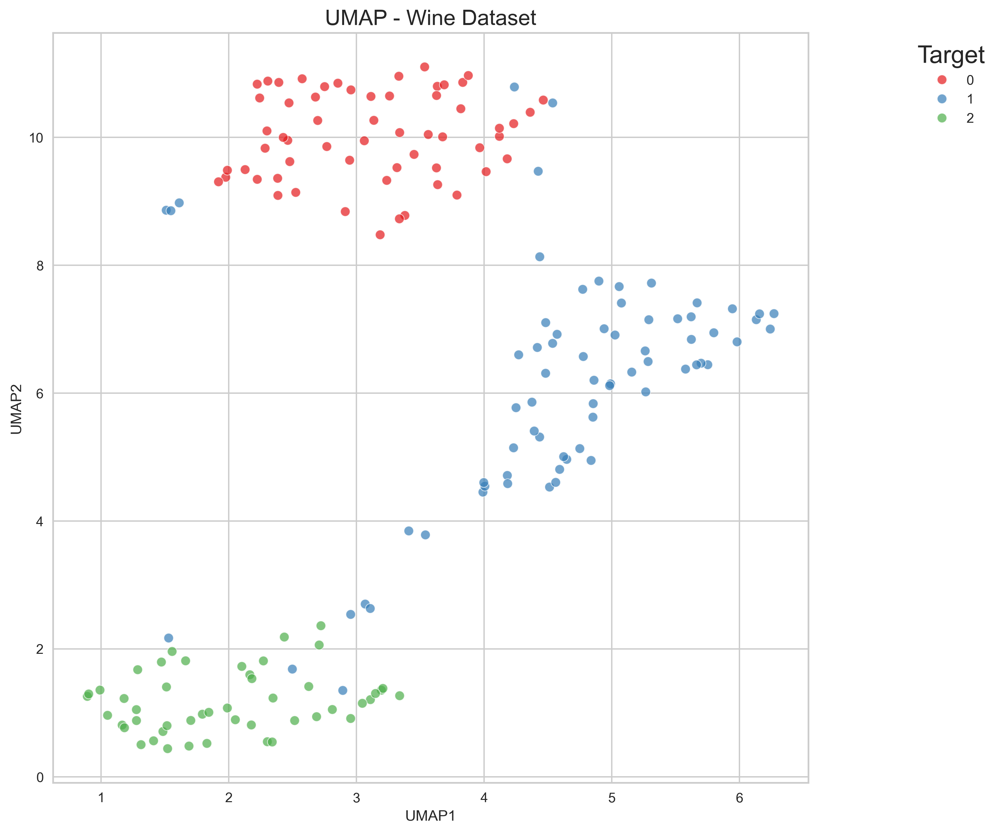

In [79]:
umap_wine = umap.UMAP(n_components=2, random_state=42)
standard_wine = pd.DataFrame(StandardScaler().fit_transform(data_wine), columns=data_wine.columns)

umap_data_wine = umap_wine.fit_transform(standard_wine)
umap_data_wine = pd.DataFrame(umap_data_wine, columns=['UMAP1', 'UMAP2'])
umap_data_wine['target'] = target_wine.values
fig, ax = plt.subplots(figsize=(10, 10), dpi = 300)
sns.scatterplot(data=umap_data_wine, x='UMAP1', y='UMAP2', hue='target', palette='Set1', ax=ax, s=50, alpha=0.7)
ax.set_title('UMAP - Wine Dataset', fontsize=16)
ax.set_xlabel('UMAP1')
ax.set_ylabel('UMAP2')
plt.legend(title='Target', loc='upper right', bbox_to_anchor=(1.25, 1))
plt.show()

# Técnicas de agrupamiento (*clustering*)

Las secciones anteriores **reducían** la dimensión para *visualizar*. El **agrupamiento** persigue un objetivo distinto: **descubrir grupos** (clusters) de muestras similares **sin** usar las etiquetas. Es una tarea *no supervisada*: el algoritmo propone una partición de los datos, y luego nosotros la evaluamos —por ejemplo, comparándola con las clases reales o midiendo su cohesión interna.

## K-Means

> Utilizando el método del Codo (*Elbow Method*) y el método de Silueta promedio (*Silhouette Score*), determine la cantidad óptima de grupos para los datos `wine` y `digits`.

K-Means requiere fijar de antemano el número de grupos *k*, así que necesitamos criterios para elegirlo:

- **Método del codo (*Elbow*)**: grafica la inercia (suma de distancias al cuadrado dentro de cada grupo) en función de *k*. Esta siempre disminuye al aumentar *k*; buscamos el "codo" donde añadir grupos deja de aportar mejoras notorias.
- **Silueta promedio (*Silhouette Score*)**: mide qué tan bien encaja cada punto en su grupo frente al grupo vecino, en un rango de −1 a 1. Valores altos indican grupos compactos y bien separados; se elige el *k* que **maximiza** la silueta.

Ambos criterios son **heurísticos** y pueden no coincidir, como veremos a continuación.

K-Means es un algoritmo de agrupamiento que busca **centroides** (centros) y asigna cada muestra al centroide más cercano; los grupos quedan definidos por esas distancias. Su ventaja es que es **sencillo, rápido e interpretable**. Sus supuestos también son sus limitaciones: tiende a encontrar grupos **esféricos y de tamaño similar**, y es sensible a la escala de las variables (de ahí que trabajemos con datos estandarizados).

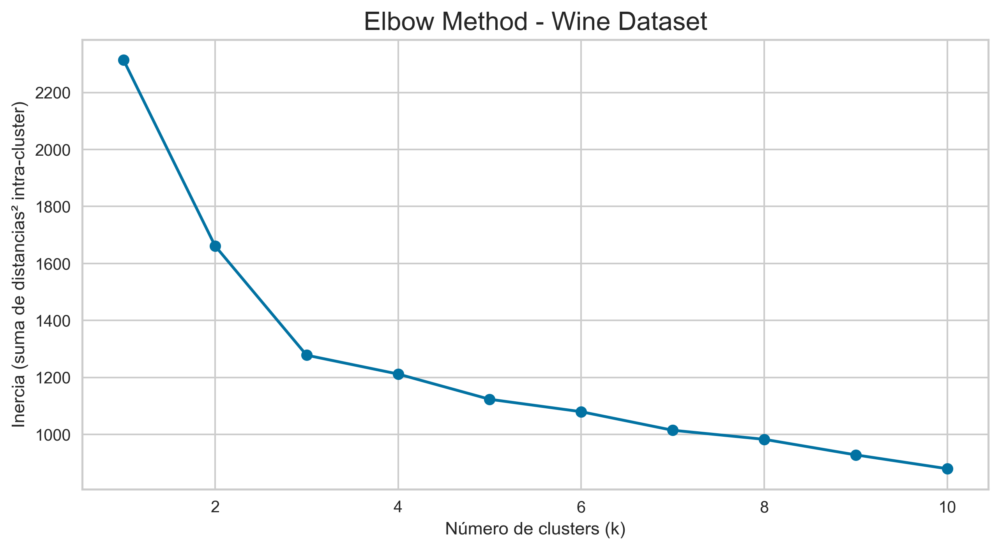

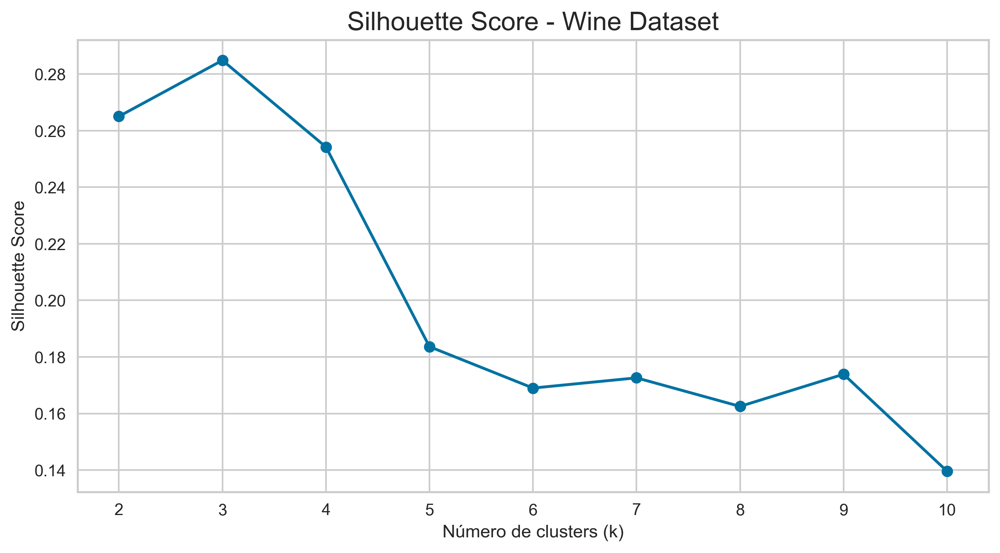

In [80]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# --- Elbow method para wine (inercia vs k) ---
standard_wine = pd.DataFrame(StandardScaler().fit_transform(data_wine), columns=data_wine.columns)
inertia_wine = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(standard_wine)
    inertia_wine.append(kmeans.inertia_)
fig, ax = plt.subplots(figsize=(10, 5), dpi=300)
ax.plot(range(1, 11), inertia_wine, marker='o')
ax.set_xlabel('Número de clusters (k)')
ax.set_ylabel('Inercia (suma de distancias² intra-cluster)')
ax.set_title('Elbow Method - Wine Dataset', fontsize=16)
plt.show()

# --- Silhouette para wine ---
silhouette_kmeans = []
for k in range(2, 11):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(standard_wine)
    score = silhouette_score(standard_wine, kmeans.labels_)
    silhouette_kmeans.append(score)
fig, ax = plt.subplots(figsize=(10, 5), dpi=300)
ax.plot(range(2, 11), silhouette_kmeans, marker='o')
ax.set_xlabel('Número de clusters (k)')
ax.set_ylabel('Silhouette Score')
ax.set_title('Silhouette Score - Wine Dataset', fontsize=16)
plt.show()

Los criterios sugieren entre *k=3* y *k=4* grupos. Analicemos cuál describe mejor los datos comparando la partición con las etiquetas reales.

[10-06-2026 14:45:23] [pca.pca] [INFO] Extracting column labels from dataframe.
[10-06-2026 14:45:23] [pca.pca] [INFO] Normalizing input data per feature (zero mean and unit variance)..
[10-06-2026 14:45:23] [pca.pca] [INFO] The PCA reduction is performed on 13 variables (columns) of the input dataframe.
[10-06-2026 14:45:23] [pca.pca] [INFO] Fit using PCA.
[10-06-2026 14:45:23] [pca.pca] [INFO] Compute loadings and PCs.
[10-06-2026 14:45:23] [pca.pca] [INFO] Compute explained variance.
[10-06-2026 14:45:23] [pca.pca] [INFO] Outlier detection using Hotelling T2 test with alpha=[0.05] and n_components=[2]
[10-06-2026 14:45:23] [pca.pca] [INFO] Multiple test correction applied for Hotelling T2 test: [fdr_bh]
[10-06-2026 14:45:23] [pca.pca] [INFO] Outlier detection using SPE/DmodX with n_std=[3]


Text(0.5, 1.0, 'Biplot PCA - Wine Dataset con KMeans')

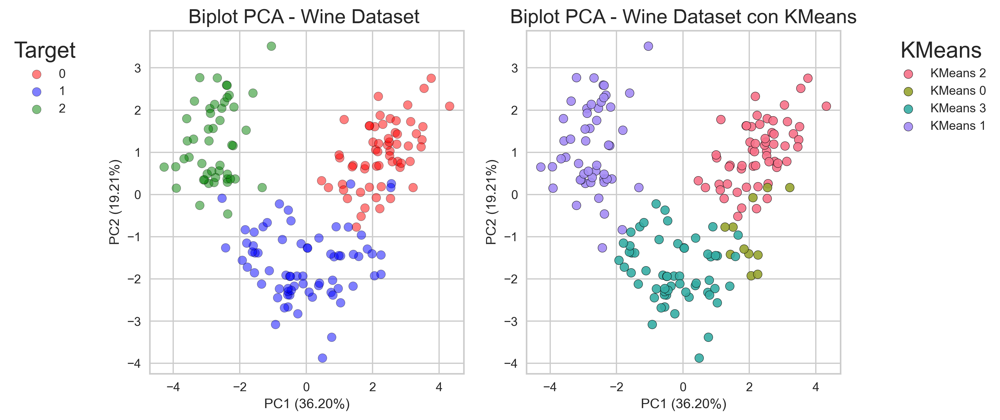

In [81]:
# k = 4
kmeans_wine = KMeans(n_clusters=4, random_state=42)
kmeans_wine.fit(standard_wine)
pca_wine_kmeans = pca(n_components=2, normalize=True)
pca_data_wine = pca_wine_kmeans.fit_transform(standard_wine, kmeans_wine.labels_)
pca1_pc2 = pca_data_wine['PC'].copy()
pca1_pc2['target-kmean'] = kmeans_wine.labels_
pca1_pc2['target'] = target_wine.values
fig, ax = plt.subplots(1,2 ,figsize=(10, 5), dpi = 300)
colors = ['red', 'blue', 'green']
for c, targ in enumerate(pca1_pc2['target'].unique()):
    unique_target = pca1_pc2[pca1_pc2['target'] == targ]
    ax[0].scatter(unique_target['PC1'], unique_target['PC2'], label=targ, s=50,
               color=colors[c], alpha=0.5, edgecolor='black')
ax[0].set_xlabel('PC1' + f' ({pca_data_wine["explained_var"][0]:.2%})')
ax[0].set_ylabel('PC2' + f' ({pca_data_wine["explained_var"][1] - pca_data_wine["explained_var"][0] :.2%})')
ax[0].set_title('Biplot PCA - Wine Dataset ', fontsize=16)
ax[0].legend(title='Target', loc='upper right', bbox_to_anchor=(-0.2, 1))
colors = sns.color_palette("husl", len(pca1_pc2['target-kmean'].unique()))
for c, targ in enumerate(pca1_pc2['target-kmean'].unique()):
    unique_target = pca1_pc2[pca1_pc2['target-kmean'] == targ]
    ax[1].scatter(unique_target['PC1'], unique_target['PC2'], label=f'KMeans {targ}', s=50,
               color=colors[c], alpha=0.9, edgecolor='black', marker='o')
explaine_var_wine = pca_data_wine['explained_var']
ax[1].legend(title='KMeans', loc='upper right', bbox_to_anchor=(1.5, 1))
ax[1].set_xlabel('PC1' + f' ({explaine_var_wine[0]:.2%})')
ax[1].set_ylabel('PC2' + f' ({explaine_var_wine[1] - explaine_var_wine[0] :.2%})')
ax[1].set_title('Biplot PCA - Wine Dataset con KMeans', fontsize=16)
# KMeans para digits

[10-06-2026 14:45:24] [pca.pca] [INFO] Extracting column labels from dataframe.
[10-06-2026 14:45:24] [pca.pca] [INFO] Normalizing input data per feature (zero mean and unit variance)..
[10-06-2026 14:45:24] [pca.pca] [INFO] The PCA reduction is performed on 13 variables (columns) of the input dataframe.
[10-06-2026 14:45:24] [pca.pca] [INFO] Fit using PCA.
[10-06-2026 14:45:24] [pca.pca] [INFO] Compute loadings and PCs.
[10-06-2026 14:45:24] [pca.pca] [INFO] Compute explained variance.
[10-06-2026 14:45:24] [pca.pca] [INFO] Outlier detection using Hotelling T2 test with alpha=[0.05] and n_components=[2]
[10-06-2026 14:45:24] [pca.pca] [INFO] Multiple test correction applied for Hotelling T2 test: [fdr_bh]
[10-06-2026 14:45:24] [pca.pca] [INFO] Outlier detection using SPE/DmodX with n_std=[3]


Text(0.5, 1.0, 'Biplot PCA - Wine Dataset con KMeans')

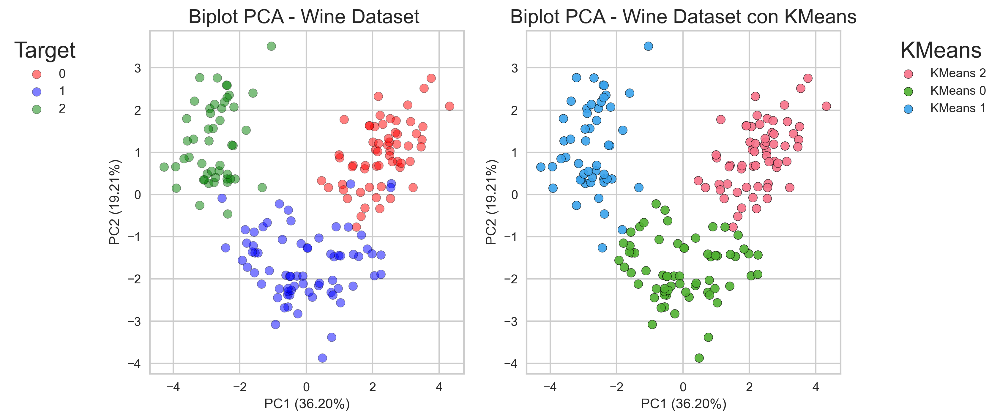

In [82]:
# k = 3 wine
# k = 4
kmeans_wine = KMeans(n_clusters=3, random_state=42)
kmeans_wine.fit(standard_wine)
pca_wine_kmeans = pca(n_components=2, normalize=True)
pca_data_wine = pca_wine_kmeans.fit_transform(standard_wine, kmeans_wine.labels_)
pca1_pc2 = pca_data_wine['PC'].copy()
pca1_pc2['target-kmean'] = kmeans_wine.labels_
pca1_pc2['target'] = target_wine.values
fig, ax = plt.subplots(1,2 ,figsize=(10, 5), dpi = 300)
colors = ['red', 'blue', 'green']
for c, targ in enumerate(pca1_pc2['target'].unique()):
    unique_target = pca1_pc2[pca1_pc2['target'] == targ]
    ax[0].scatter(unique_target['PC1'], unique_target['PC2'], label=targ, s=50,
               color=colors[c], alpha=0.5, edgecolor='black')
ax[0].set_xlabel('PC1' + f' ({pca_data_wine["explained_var"][0]:.2%})')
ax[0].set_ylabel('PC2' + f' ({pca_data_wine["explained_var"][1] - pca_data_wine["explained_var"][0] :.2%})')
ax[0].set_title('Biplot PCA - Wine Dataset ', fontsize=16)
ax[0].legend(title='Target', loc='upper right', bbox_to_anchor=(-0.2, 1))
colors = sns.color_palette("husl", len(pca1_pc2['target-kmean'].unique()))
for c, targ in enumerate(pca1_pc2['target-kmean'].unique()):
    unique_target = pca1_pc2[pca1_pc2['target-kmean'] == targ]
    ax[1].scatter(unique_target['PC1'], unique_target['PC2'], label=f'KMeans {targ}', s=50,
               color=colors[c], alpha=0.9, edgecolor='black', marker='o')
explaine_var_wine = pca_data_wine['explained_var']
ax[1].legend(title='KMeans', loc='upper right', bbox_to_anchor=(1.5, 1))
ax[1].set_xlabel('PC1' + f' ({explaine_var_wine[0]:.2%})')
ax[1].set_ylabel('PC2' + f' ({explaine_var_wine[1] - explaine_var_wine[0] :.2%})')
ax[1].set_title('Biplot PCA - Wine Dataset con KMeans', fontsize=16)
# KMeans para digits

Podemos ver que **k=3** es el mejor, a pesar de que el método del codo sugería *k=4*. Esto es esperable: como `wine` tiene 3 cultivares reales, *k=3* recupera la estructura verdadera. Es un buen recordatorio de que los criterios automáticos son **orientativos** y deben contrastarse con el **conocimiento del problema** y la inspección visual.

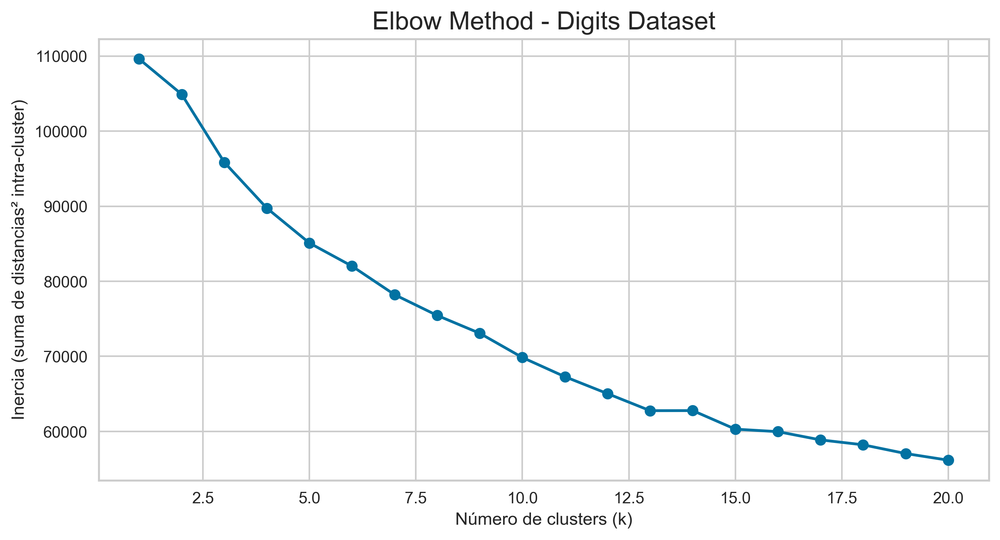

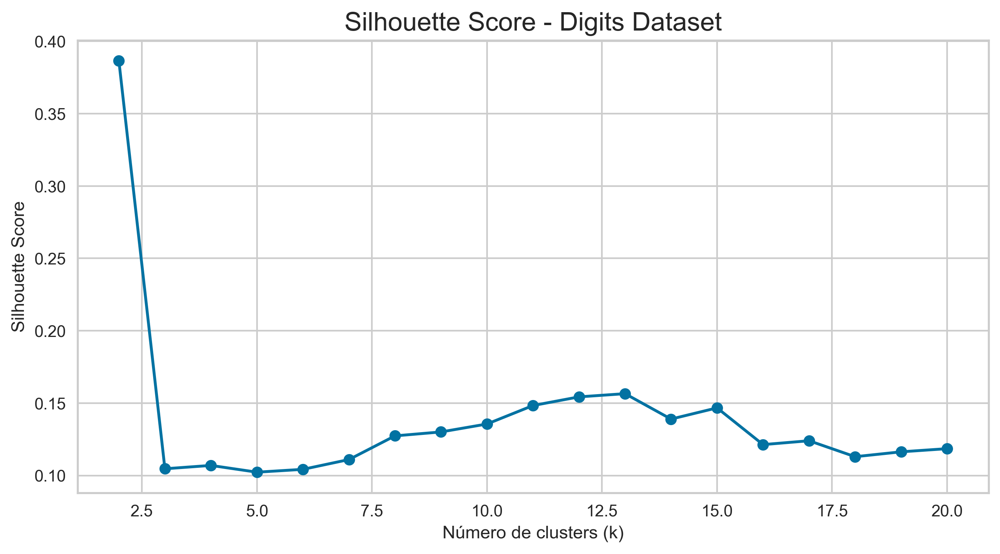

In [83]:
# --- Elbow method para digits (inercia vs k) ---
standard_digits = pd.DataFrame(StandardScaler().fit_transform(data_digits), columns=data_digits.columns)
inertia_digits = []
for k in range(1, 21):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(standard_digits)
    inertia_digits.append(kmeans.inertia_)
fig, ax = plt.subplots(figsize=(10, 5), dpi=300)
ax.plot(range(1, 21), inertia_digits, marker='o')
ax.set_xlabel('Número de clusters (k)')
ax.set_ylabel('Inercia (suma de distancias² intra-cluster)')
ax.set_title('Elbow Method - Digits Dataset', fontsize=16)
plt.show()

# --- Silhouette para digits ---
silhouette_kmeans_digits = []
for k in range(2, 21):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(standard_digits)
    score = silhouette_score(standard_digits, kmeans.labels_)
    silhouette_kmeans_digits.append(score)
fig, ax = plt.subplots(figsize=(10, 5), dpi=300)
ax.plot(range(2, 21), silhouette_kmeans_digits, marker='o')
ax.set_xlabel('Número de clusters (k)')
ax.set_ylabel('Silhouette Score')
ax.set_title('Silhouette Score - Digits Dataset', fontsize=16)
plt.show()

En este caso, el método del codo indica *k=10*, mientras que el de silueta sugiere *k=13*. Visualicemos ambas particiones sobre el *embedding* de UMAP para decidir.

/Users/gabbi/miniconda3/envs/SaaLab/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


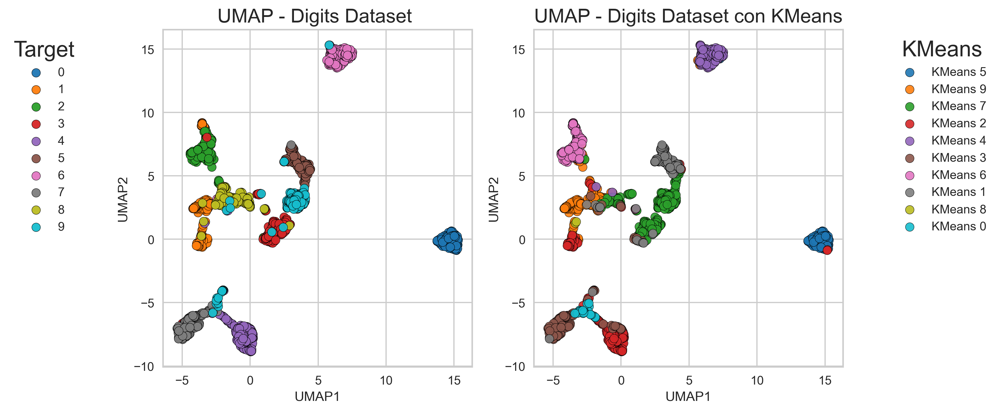

In [84]:
# Biplot Digits k = 10 y umap para embeddings
kmeans_digits = KMeans(n_clusters=10, random_state=42)
kmeans_digits.fit(standard_digits)
umap_digits = umap.UMAP(n_components=2, random_state=42)
umap_data_digits = umap_digits.fit_transform(standard_digits)
umap_data_digits = pd.DataFrame(umap_data_digits, columns=['UMAP1', 'UMAP2'])
umap_data_digits['target-kmean'] = kmeans_digits.labels_
umap_data_digits['target'] = target_digits.values
fig, ax = plt.subplots(1,2 ,figsize=(10, 5), dpi = 300)
colors = sns.color_palette("tab10", len(umap_data_digits['target'].unique()))
for c, targ in enumerate(umap_data_digits['target'].unique()):
    unique_target = umap_data_digits[umap_data_digits['target'] == targ]
    ax[0].scatter(unique_target['UMAP1'], unique_target['UMAP2'], label=targ, s=50,
               color=colors[c], alpha=0.95, edgecolor='black')
ax[0].legend(title='Target', loc='upper right', bbox_to_anchor=(-0.25, 1))
ax[0].set_xlabel('UMAP1')
ax[0].set_ylabel('UMAP2')
ax[0].set_title('UMAP - Digits Dataset ', fontsize=16)

colors = sns.color_palette("tab10", len(umap_data_digits['target-kmean'].unique()))
for c, targ in enumerate(umap_data_digits['target-kmean'].unique()):
    unique_target = umap_data_digits[umap_data_digits['target-kmean'] == targ]
    ax[1].scatter(unique_target['UMAP1'], unique_target['UMAP2'], label=f'KMeans {targ}', s=50,
               color=colors[c], alpha=0.9, edgecolor='black')
explaine_var_digits = umap_data_digits['explained_var'] if 'explained_var' in umap_data_digits else [0.0, 0.0]
ax[1].legend(title='KMeans', loc='upper right', bbox_to_anchor=(1.5, 1))
ax[1].set_xlabel('UMAP1')
ax[1].set_ylabel('UMAP2')
ax[1].set_title('UMAP - Digits Dataset con KMeans', fontsize=16)
plt.show()

/Users/gabbi/miniconda3/envs/SaaLab/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


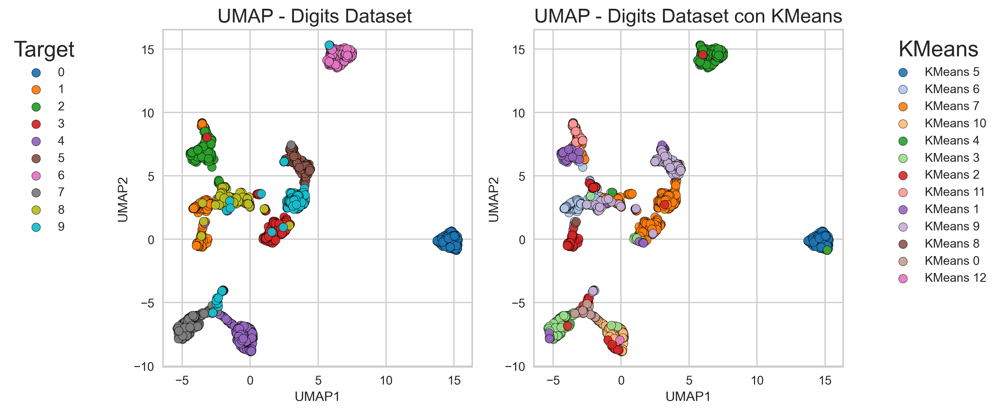

In [85]:
# k = 13
kmeans_digits = KMeans(n_clusters=13, random_state=42)
kmeans_digits.fit(standard_digits)
umap_digits = umap.UMAP(n_components=2, random_state=42)
umap_data_digits = umap_digits.fit_transform(standard_digits)
umap_data_digits = pd.DataFrame(umap_data_digits, columns=['UMAP1', 'UMAP2'])
umap_data_digits['target-kmean'] = kmeans_digits.labels_
umap_data_digits['target'] = target_digits.values
fig, ax = plt.subplots(1,2 ,figsize=(10, 5), dpi = 300)
colors = sns.color_palette("tab10", len(umap_data_digits['target'].unique()))
for c, targ in enumerate(umap_data_digits['target'].unique()):
    unique_target = umap_data_digits[umap_data_digits['target'] == targ]
    ax[0].scatter(unique_target['UMAP1'], unique_target['UMAP2'], label=targ, s=50,
               color=colors[c], alpha=0.95, edgecolor='black')
ax[0].legend(title='Target', loc='upper right', bbox_to_anchor=(-0.25, 1))
ax[0].set_xlabel('UMAP1')
ax[0].set_ylabel('UMAP2')
ax[0].set_title('UMAP - Digits Dataset ', fontsize=16)
colors = sns.color_palette("tab20", len(umap_data_digits['target-kmean'].unique()))
for c, targ in enumerate(umap_data_digits['target-kmean'].unique()):
    unique_target = umap_data_digits[umap_data_digits['target-kmean'] == targ]
    ax[1].scatter(unique_target['UMAP1'], unique_target['UMAP2'], label=f'KMeans {targ}', s=50,
               color=colors[c], alpha=0.9, edgecolor='black')
explaine_var_digits = umap_data_digits['explained_var'] if 'explained_var' in umap_data_digits else [0.0, 0.0]
ax[1].legend(title='KMeans', loc='upper right', bbox_to_anchor=(1.5, 1))
ax[1].set_xlabel('UMAP1')
ax[1].set_ylabel('UMAP2')
ax[1].set_title('UMAP - Digits Dataset con KMeans', fontsize=16)
plt.show()

Mediante el análisis visual concluimos que **k=10** es lo más adecuado: además de verse coherente, **coincide con la cantidad de dígitos** (0–9) del dataset. Nuevamente, el contexto del problema ayuda a desempatar entre los criterios.

## Agrupamiento jerárquico

A diferencia de K-Means, el **agrupamiento jerárquico aglomerativo** no requiere fijar *k* de antemano: parte considerando cada muestra como su propio grupo y va **fusionando** los más cercanos paso a paso, hasta formar un único grupo. El resultado es un árbol de fusiones (**dendrograma**) que podemos "cortar" a la altura deseada para obtener el número de grupos que queramos.

La noción de "cercanía" entre grupos depende del criterio de enlace (*linkage*): *ward* (minimiza la varianza intra-grupo, por defecto en `AgglomerativeClustering`), *complete*, *average*, *single*, etc.

### Dendrogramas

El **dendrograma** visualiza el orden y la altura de las fusiones. El **eje vertical** indica la distancia a la que se unen dos grupos: fusiones a baja altura corresponden a muestras muy similares, y a gran altura, a grupos disímiles. Para elegir el número de clusters se traza un **corte horizontal**; el número de ramas que cruza ese corte es el número de grupos resultante. Saltos grandes de altura sugieren cortes "naturales".

> Visualice los dendrogramas para los agrupamientos de los datos `wine` y `digits`.

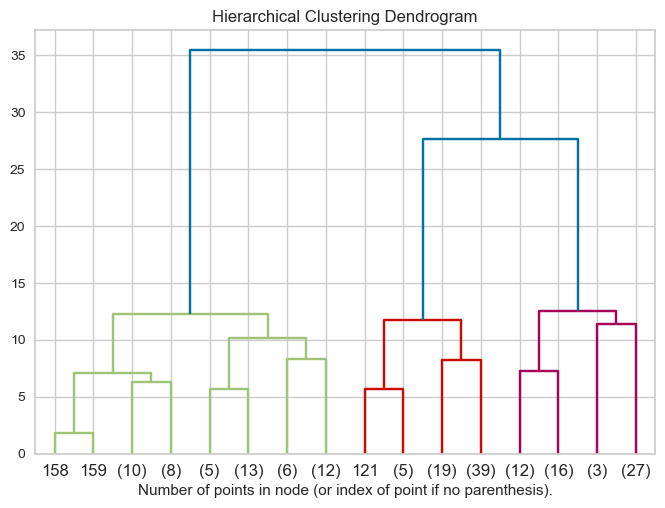

In [86]:
# silhouette para wine
import numpy as np
from matplotlib import pyplot as plt
from scipy.cluster.hierarchy import dendrogram

from sklearn.cluster import AgglomerativeClustering
from sklearn.datasets import load_iris


def plot_dendrogram(model, **kwargs):
    # Create linkage matrix and then plot the dendrogram

    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack(
        [model.children_, model.distances_, counts]
    ).astype(float)

    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix, **kwargs)


X = standard_wine.values

# setting distance_threshold=0 ensures we compute the full tree.
model = AgglomerativeClustering(distance_threshold=0, n_clusters=None)

model = model.fit(X)
plt.title("Hierarchical Clustering Dendrogram")
# plot the top three levels of the dendrogram
plot_dendrogram(model, truncate_mode="level", p=3)
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

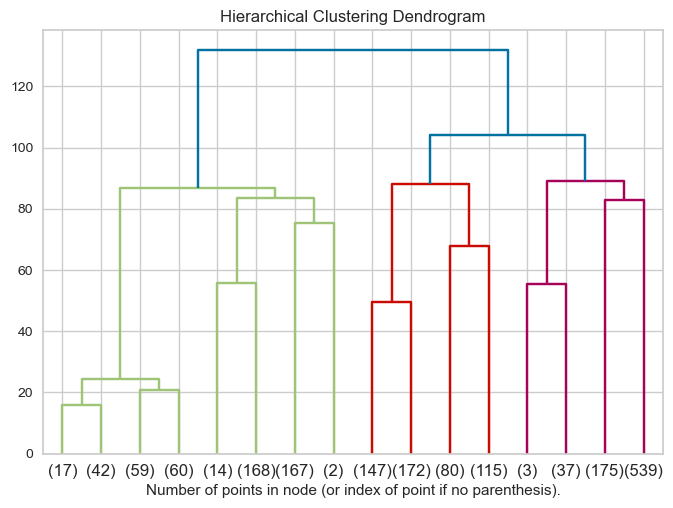

In [87]:
# silhouette para wine
import numpy as np
from matplotlib import pyplot as plt
from scipy.cluster.hierarchy import dendrogram

from sklearn.cluster import AgglomerativeClustering
from sklearn.datasets import load_iris


def plot_dendrogram(model, **kwargs):
    # Create linkage matrix and then plot the dendrogram

    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack(
        [model.children_, model.distances_, counts]
    ).astype(float)

    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix, **kwargs)


X = standard_digits.values

# setting distance_threshold=0 ensures we compute the full tree.
model = AgglomerativeClustering(distance_threshold=0, n_clusters=None)

model = model.fit(X)
plt.title("Hierarchical Clustering Dendrogram")
# plot the top three levels of the dendrogram
plot_dendrogram(model, truncate_mode="level", p=3)
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

### Agrupamiento

> Identifique el mejor número de grupos. Grafique el *Silhouette Score* en función del número de clusters y determine el óptimo.

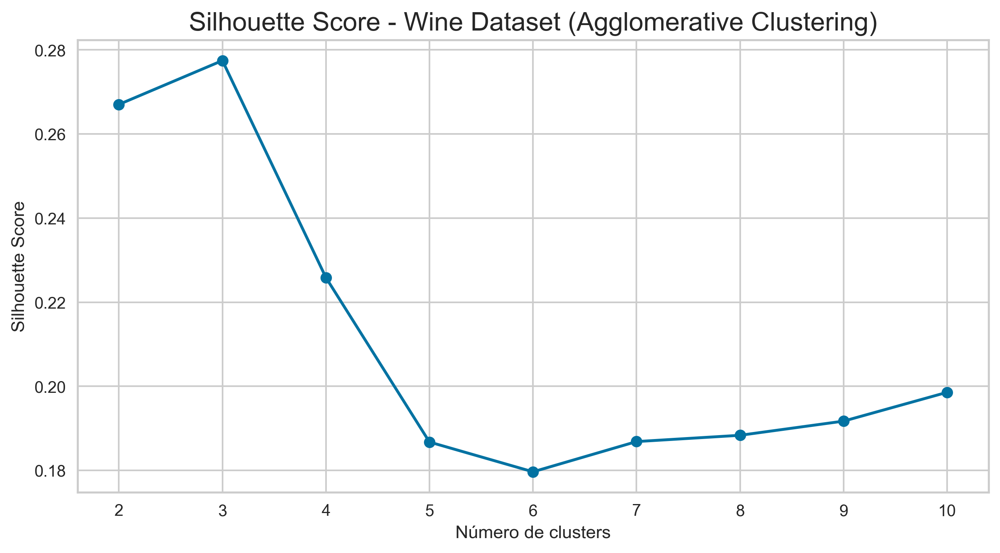

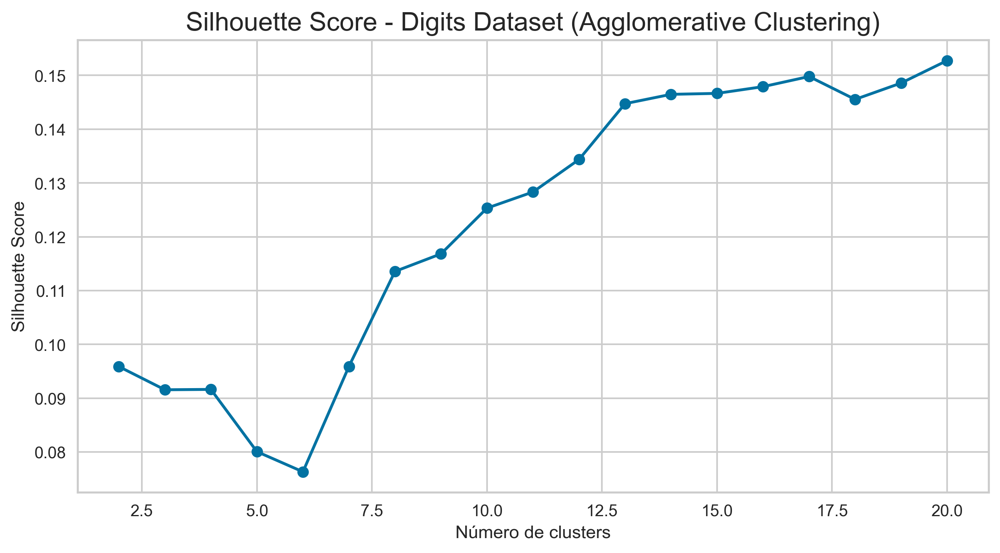

In [88]:
# argupamientos wine

from sklearn.cluster import AgglomerativeClustering
silh_agg_wine = []
for k in range(2, 11):
    agg = AgglomerativeClustering(n_clusters=k)
    agg.fit(standard_wine)
    score = silhouette_score(standard_wine, agg.labels_)
    silh_agg_wine.append(score)
fig, ax = plt.subplots(figsize=(10, 5), dpi = 300)
ax.plot(range(2, 11), silh_agg_wine, marker='o')
ax.set_xlabel('Número de clusters')
ax.set_ylabel('Silhouette Score')
ax.set_title('Silhouette Score - Wine Dataset (Agglomerative Clustering)', fontsize=16)
plt.show()
# argupamientos digits
silh_agg_digits = []    
for k in range(2, 21):
    agg = AgglomerativeClustering(n_clusters=k)
    agg.fit(standard_digits)
    score = silhouette_score(standard_digits, agg.labels_)
    silh_agg_digits.append(score)
fig, ax = plt.subplots(figsize=(10, 5), dpi = 300)
ax.plot(range(2, 21), silh_agg_digits, marker='o')
ax.set_xlabel('Número de clusters')
ax.set_ylabel('Silhouette Score')
ax.set_title('Silhouette Score - Digits Dataset (Agglomerative Clustering)', fontsize=16)
plt.show()

> Visualice los grupos utilizando PCA para `wine` y UMAP para `digits`. Compare con las etiquetas reales.

A partir de los gráficos de silueta nos quedamos con:

- **k = 3** para `wine`
- **k = 17** para `digits`

Comparemos, en cada caso, tres particiones lado a lado: las **etiquetas reales**, el resultado de **K-Means** y el de **agrupamiento jerárquico**. Esto nos permite juzgar qué método recupera mejor la estructura conocida y dónde difieren entre sí.

[10-06-2026 14:45:36] [pca.pca] [INFO] Extracting column labels from dataframe.
[10-06-2026 14:45:36] [pca.pca] [INFO] Extracting row labels from dataframe.
[10-06-2026 14:45:36] [pca.pca] [INFO] Normalizing input data per feature (zero mean and unit variance)..
[10-06-2026 14:45:36] [pca.pca] [INFO] The PCA reduction is performed on 13 variables (columns) of the input dataframe.
[10-06-2026 14:45:36] [pca.pca] [INFO] Fit using PCA.
[10-06-2026 14:45:36] [pca.pca] [INFO] Compute loadings and PCs.
[10-06-2026 14:45:36] [pca.pca] [INFO] Compute explained variance.
[10-06-2026 14:45:36] [pca.pca] [INFO] Outlier detection using Hotelling T2 test with alpha=[0.05] and n_components=[2]
[10-06-2026 14:45:36] [pca.pca] [INFO] Multiple test correction applied for Hotelling T2 test: [fdr_bh]
[10-06-2026 14:45:36] [pca.pca] [INFO] Outlier detection using SPE/DmodX with n_std=[3]


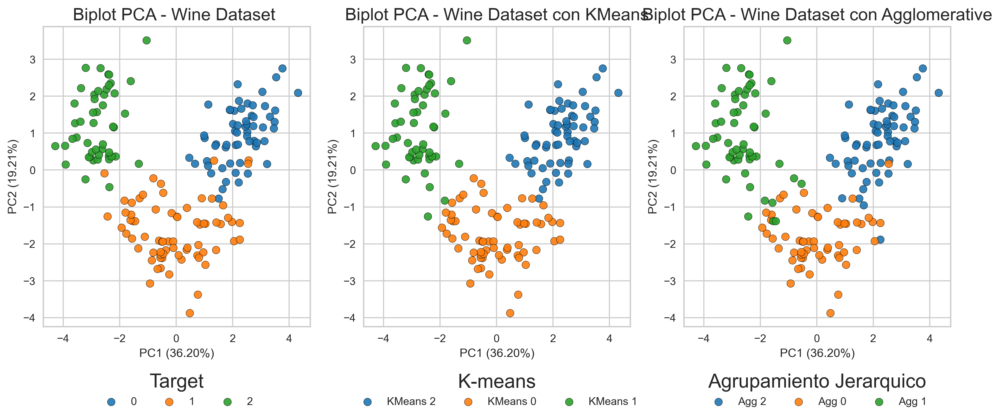

In [89]:
# wine k = 3 kmeans y k = 3 agglomerative
agg_wine = AgglomerativeClustering(n_clusters=3)
kmeans_wine = KMeans(n_clusters=3, random_state=42) # sabemos que k = 3 es bueno por el elbow y silhouette
kmeans_wine.fit(standard_wine)
agg_wine.fit(standard_wine)
pca_wine_agg = pca(n_components=2, normalize=True)
pca_data_wine_agg = pca_wine_agg.fit_transform(standard_wine)
pca_data_wine_targets = pca_data_wine_agg['PC'].copy()
pca_data_wine_targets['target-kmean'] = kmeans_wine.labels_
pca_data_wine_targets['target-agg'] = agg_wine.labels_
pca_data_wine_targets['target'] = target_wine.values
fig, ax = plt.subplots(1,3 ,figsize=(15, 5), dpi = 300)
colors = sns.color_palette("tab10", len(pca_data_wine_targets['target'].unique()))
for c, targ in enumerate(pca_data_wine_targets['target'].unique()):
    unique_target = pca_data_wine_targets[pca_data_wine_targets['target'] == targ]
    ax[0].scatter(unique_target['PC1'], unique_target['PC2'], label=targ, s=50,
               color=colors[c], alpha=0.9, edgecolor='black')
ax[0].set_xlabel('PC1' + f' ({pca_data_wine_agg["explained_var"][0]:.2%})')
ax[0].set_ylabel('PC2' + f' ({pca_data_wine_agg["explained_var"][1] - pca_data_wine_agg["explained_var"][0] :.2%})')
ax[0].set_title('Biplot PCA - Wine Dataset ', fontsize=16)
ax[0].legend(title='Target', loc='lower center', bbox_to_anchor=(0.5, -0.3), ncols = 3)

colors = sns.color_palette("tab10", len(pca_data_wine_targets['target-kmean'].unique()))
for c, targ in enumerate(pca_data_wine_targets['target-kmean'].unique()):
    unique_target = pca_data_wine_targets[pca_data_wine_targets['target-kmean'] == targ]
    ax[1].scatter(unique_target['PC1'], unique_target['PC2'], label=f'KMeans {targ}', s=50,
               color=colors[c], alpha=0.9, edgecolor='black', marker='o')
explaine_var_wine = pca_data_wine_agg['explained_var']
ax[1].legend(title='K-means', loc='lower center', bbox_to_anchor=(0.5, -0.3), ncols = 3)

ax[1].set_xlabel('PC1' + f' ({explaine_var_wine[0]:.2%})')
ax[1].set_ylabel('PC2' + f' ({explaine_var_wine[1] - explaine_var_wine[0] :.2%})')
ax[1].set_title('Biplot PCA - Wine Dataset con KMeans', fontsize=16)
colors = sns.color_palette("tab10", len(pca_data_wine_targets['target-agg'].unique()))
for c, targ in enumerate(pca_data_wine_targets['target-agg'].unique()):
    unique_target = pca_data_wine_targets[pca_data_wine_targets['target-agg'] == targ]
    ax[2].scatter(unique_target['PC1'], unique_target['PC2'], label=f'Agg {targ}', s=50,
               color=colors[c], alpha=0.9, edgecolor='black', marker='o')
explaine_var_wine = pca_data_wine_agg['explained_var']
ax[2].legend(title='Agrupamiento Jerarquico', loc='lower center', bbox_to_anchor=(0.5, -0.3), ncols = 3)
ax[2].set_xlabel('PC1' + f' ({explaine_var_wine[0]:.2%})')
ax[2].set_ylabel('PC2' + f' ({explaine_var_wine[1] - explaine_var_wine[0] :.2%})')
ax[2].set_title('Biplot PCA - Wine Dataset con Agglomerative', fontsize=16)
plt.show()


/Users/gabbi/miniconda3/envs/SaaLab/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


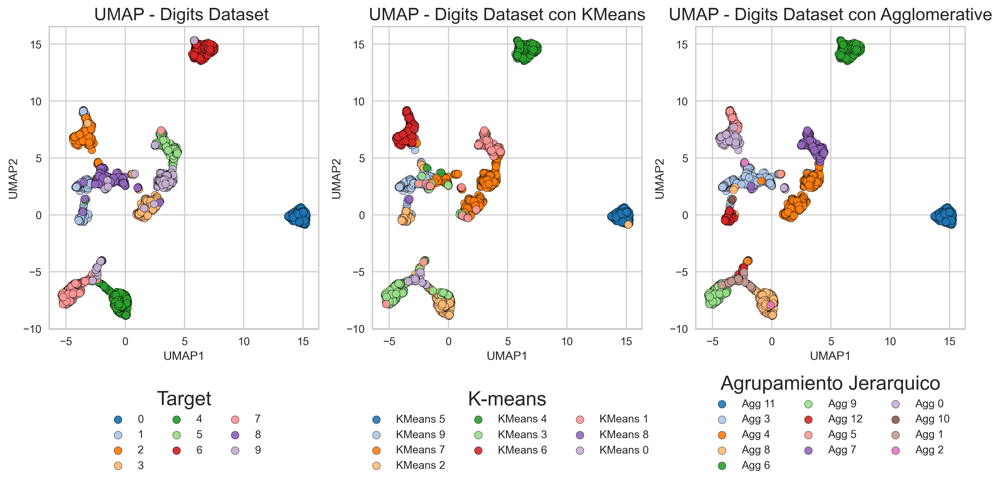

In [90]:
# digits umap
agg_digits = AgglomerativeClustering(n_clusters=13)
kmeans_digits = KMeans(n_clusters=10, random_state=42) # sabemos que k = 10 es bueno por el elbow y silhouette
kmeans_digits.fit(standard_digits)
agg_digits.fit(standard_digits)
umap_digits = umap.UMAP(n_components=2, random_state=42)
umap_data_digits = umap_digits.fit_transform(standard_digits)
umap_data_digits = pd.DataFrame(umap_data_digits, columns=['UMAP1', 'UMAP2'])
umap_data_digits['target-kmean'] = kmeans_digits.labels_
umap_data_digits['target-agg'] = agg_digits.labels_
umap_data_digits['target'] = target_digits.values
fig, ax = plt.subplots(1,3 ,figsize=(15, 5), dpi = 300)
colors = sns.color_palette("tab20", len(umap_data_digits['target'].unique()))
for c, targ in enumerate(umap_data_digits['target'].unique()):
    unique_target = umap_data_digits[umap_data_digits['target'] == targ]
    ax[0].scatter(unique_target['UMAP1'], unique_target['UMAP2'], label=targ, s=50,
               color=colors[c], alpha=0.95, edgecolor='black')
ax[0].set_xlabel('UMAP1')
ax[0].set_ylabel('UMAP2')
ax[0].set_title('UMAP - Digits Dataset ', fontsize=16)
ax[0].legend(title='Target', loc='lower center', bbox_to_anchor=(0.5, -0.5), ncols = 3)
colors = sns.color_palette("tab20", len(umap_data_digits['target-kmean'].unique()))                 
for c, targ in enumerate(umap_data_digits['target-kmean'].unique()):
    unique_target = umap_data_digits[umap_data_digits['target-kmean'] == targ]
    ax[1].scatter(unique_target['UMAP1'], unique_target['UMAP2'], label=f'KMeans {targ}', s=50,
               color=colors[c], alpha=0.9, edgecolor='black', marker='o')
ax[1].legend(title='K-means', loc='lower center', bbox_to_anchor=(0.5, -0.5), ncols = 3)
ax[1].set_xlabel('UMAP1')
ax[1].set_ylabel('UMAP2')
ax[1].set_title('UMAP - Digits Dataset con KMeans', fontsize=16)    
colors = sns.color_palette("tab20", len(umap_data_digits['target-agg'].unique()))   
for c, targ in enumerate(umap_data_digits['target-agg'].unique()):
    unique_target = umap_data_digits[umap_data_digits['target-agg'] == targ]
    ax[2].scatter(unique_target['UMAP1'], unique_target['UMAP2'], label=f'Agg {targ}', s=50,
               color=colors[c], alpha=0.9, edgecolor='black', marker='o')
ax[2].legend(title='Agrupamiento Jerarquico', loc='lower center', bbox_to_anchor=(0.5, -0.5), ncols = 3)
ax[2].set_xlabel('UMAP1')
ax[2].set_ylabel('UMAP2')
ax[2].set_title('UMAP - Digits Dataset con Agglomerative', fontsize=16)
plt.show()

# Conclusiones

En esta ayudantía recorrimos el flujo típico de un **análisis multivariado** exploratorio y aprendimos a elegir la herramienta según la estructura de los datos:

- **PCA** es lineal, rápido e interpretable (vía *loadings*), y resultó suficiente para separar las clases de `wine`. Es la primera herramienta a probar, pero **exige estandarizar** las variables cuando tienen escalas distintas.
- **t-SNE y UMAP** capturan estructura **no lineal** y fueron necesarias para visualizar `digits`. Son excelentes para *explorar*, pero sus distancias globales **no deben sobreinterpretarse** y dependen de hiperparámetros y de la semilla.
- **K-Means** es simple y eficiente pero supone grupos esféricos y requiere fijar *k*; el **agrupamiento jerárquico** ofrece una visión multiescala mediante el dendrograma sin fijar *k* de antemano.
- Los criterios para elegir *k* (**codo** y **silueta**) son **heurísticos** y pueden discrepar: conviene contrastarlos con la **inspección visual** y el **conocimiento del problema**, como ocurrió al recuperar los 3 cultivares de `wine` y los 10 dígitos de `digits`.

> **Idea central:** no existe una única técnica "correcta". El análisis multivariado consiste en **combinar** reducción de dimensionalidad y agrupamiento, validando siempre los resultados frente al contexto del problema.